In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import pyfolio as pf
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.datasets import make_classification


/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/pyfolio/pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(


In [10]:
import pandas as pd

def extract_metrics(df, folder, dataset, model, phase):
    ae_perf_stats = pf.timeseries.perf_stats(df['autoencoder'])
    gauss_perf_stats = pf.timeseries.perf_stats(df['gauss'])
    both_perf_stats = pf.timeseries.perf_stats(df['both'])
    na_perf_stats = pf.timeseries.perf_stats(df['NA'])
    benchmark_perf_stats = pf.timeseries.perf_stats(df['benchmark'])
    
    perf_stats = pd.concat([ae_perf_stats, both_perf_stats, gauss_perf_stats, na_perf_stats, benchmark_perf_stats], axis=1)
    perf_stats.columns = ['autoencoder', 'both', 'gauss', 'NA', 'benchmark']
    
    metrics = perf_stats.loc[['Annual return']]
    metrics['Model'] = model
    metrics['Dataset'] = dataset
    metrics['Phase'] = phase
    metrics['Seed'] = folder
    return metrics

# Initialize an empty DataFrame to store all results
all_metrics_df = pd.DataFrame()

# Iterate over the models (DRL, PPO), datasets, and folders
models = ['DRL', 'PPO']
folders = ['results 555', 'results 537', 'results 777',  'results 333',  'results 735']
for model in models:
    for folder in folders:
        for i in range(4, 8):
            dataset = i
            both_returns = pd.read_parquet(f"{folder}/{model}_both_returns_test_{dataset}.parquet")
            ae_returns = pd.read_parquet(f"{folder}/{model}_ae_returns_test_{dataset}.parquet")
            gauss_returns = pd.read_parquet(f"{folder}/{model}_gauss_returns_test_{dataset}.parquet")
            na_returns = pd.read_parquet(f"{folder}/{model}_na_returns_test_{dataset}.parquet")

            # Combine returns into a single DataFrame
            df_all = pd.concat([ae_returns['tf-agent'], both_returns['tf-agent'], gauss_returns['tf-agent'], na_returns['tf-agent'], na_returns['benchmark']], axis=1)
            df_all.columns = ['autoencoder', "both", 'gauss', 'NA', 'benchmark']
            df_ret = df_all / df_all.shift(1) - 1
            df_ret = df_ret[1:]

            # Split data into recession (first half) and recovery (second half)
            split_point = df_ret['benchmark'].idxmin()
            df_recession = df_ret.loc[:split_point]
            df_recovery = df_ret.loc[split_point:]

            # Extract metrics for recession, recovery, and overall
            recession_metrics = extract_metrics(df_recession, folder[-3:], dataset, model, "Recession")
            recovery_metrics = extract_metrics(df_recovery, folder[-3:], dataset, model, "Recovery")
            overall_metrics = extract_metrics(df_ret, folder[-3:], dataset, model, "Overall")

            # Append the metrics to the large DataFrame
            all_metrics_df = pd.concat([all_metrics_df, recession_metrics, recovery_metrics, overall_metrics], axis=0)
all_metrics_df = all_metrics_df.reset_index(drop=True)
df_avg = all_metrics_df.drop(columns='Seed').groupby(['Model', 'Dataset', 'Phase']).mean().reset_index()

df_avg.to_csv("finalresults.csv")

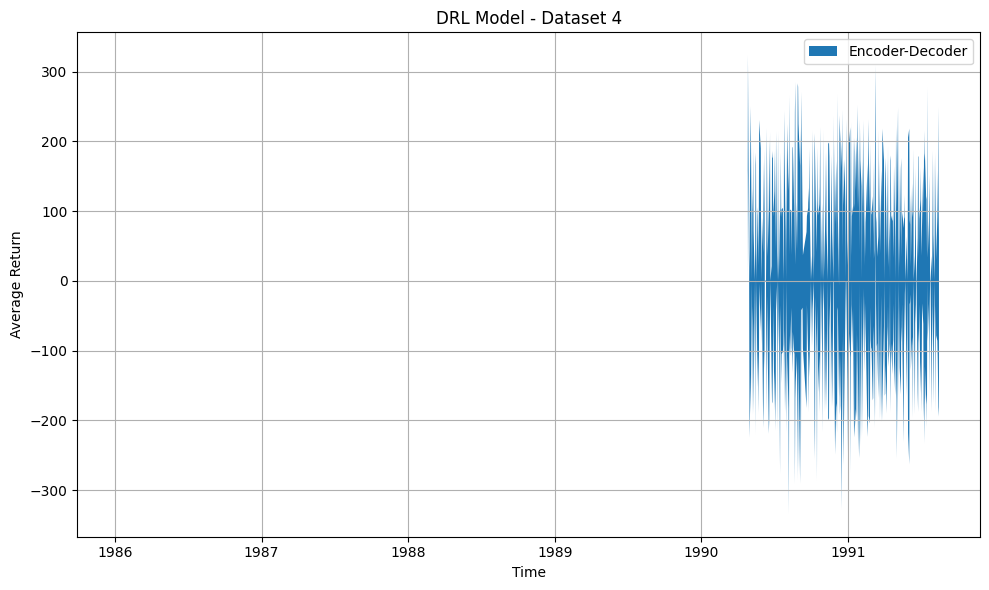

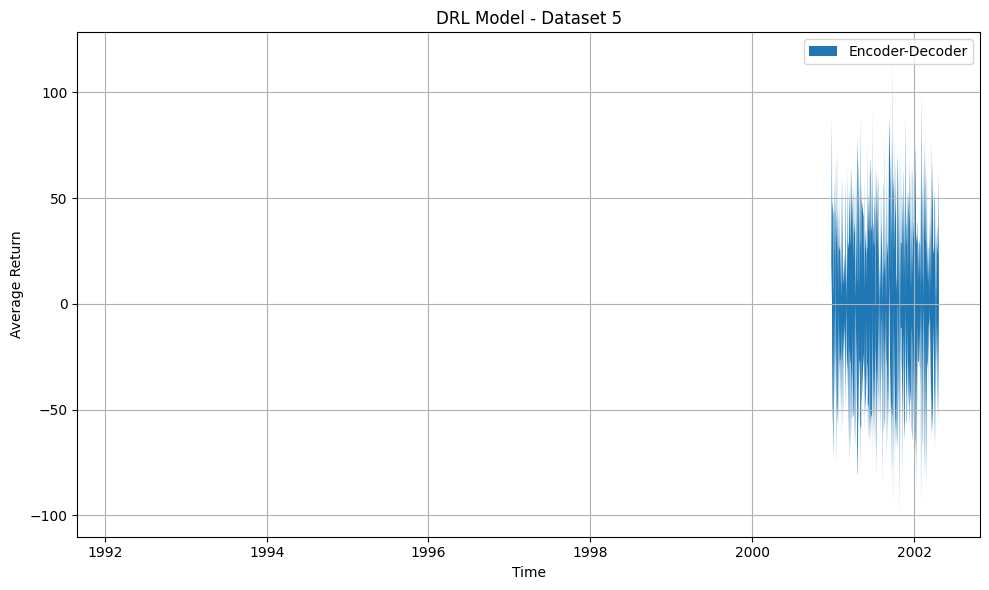

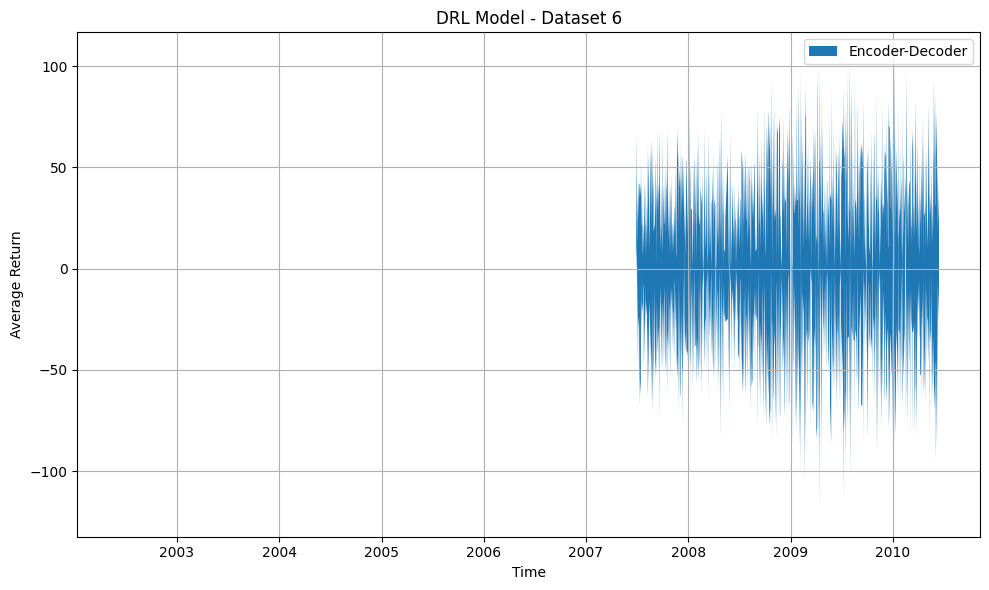

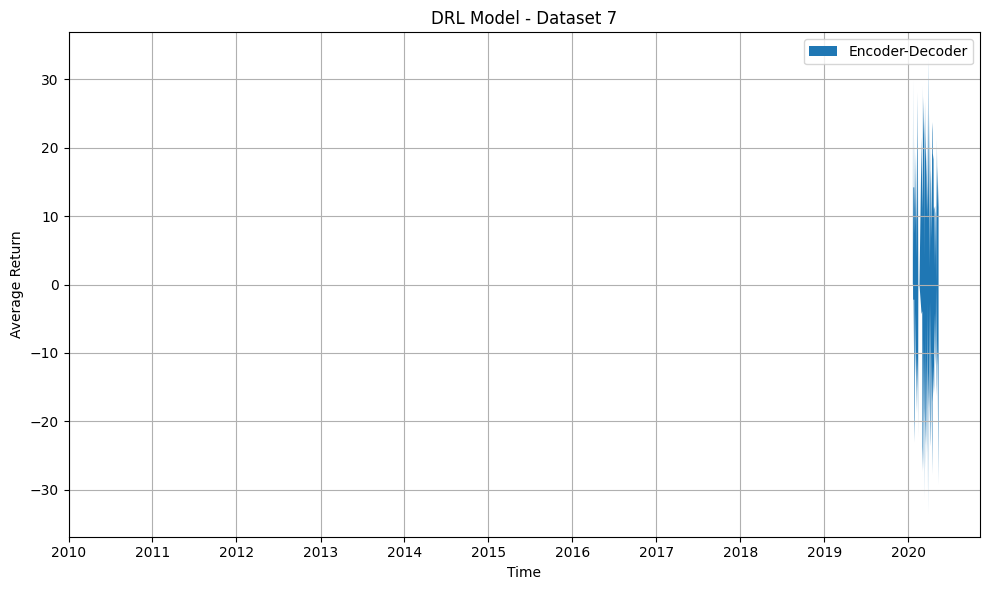

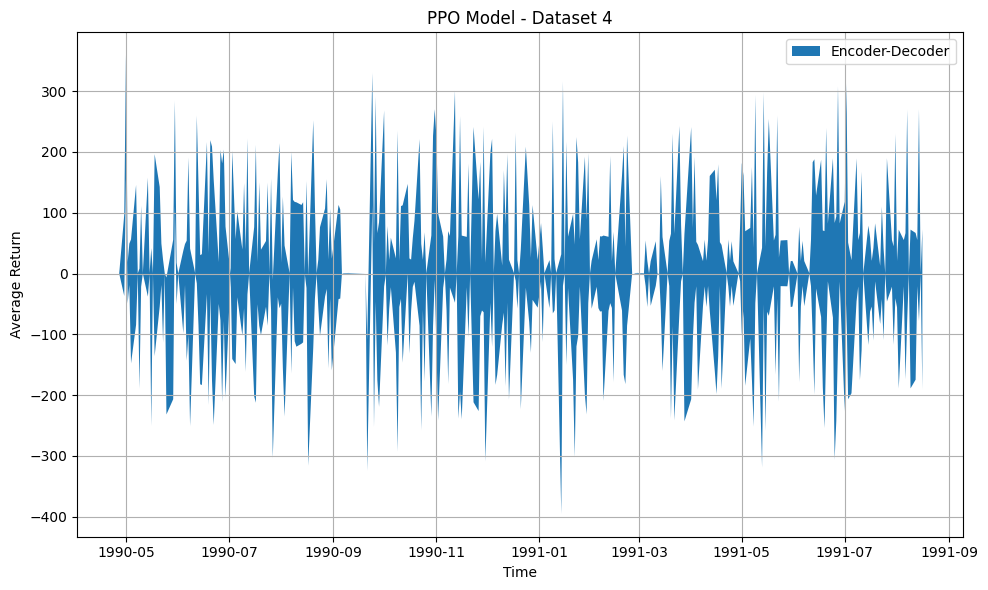

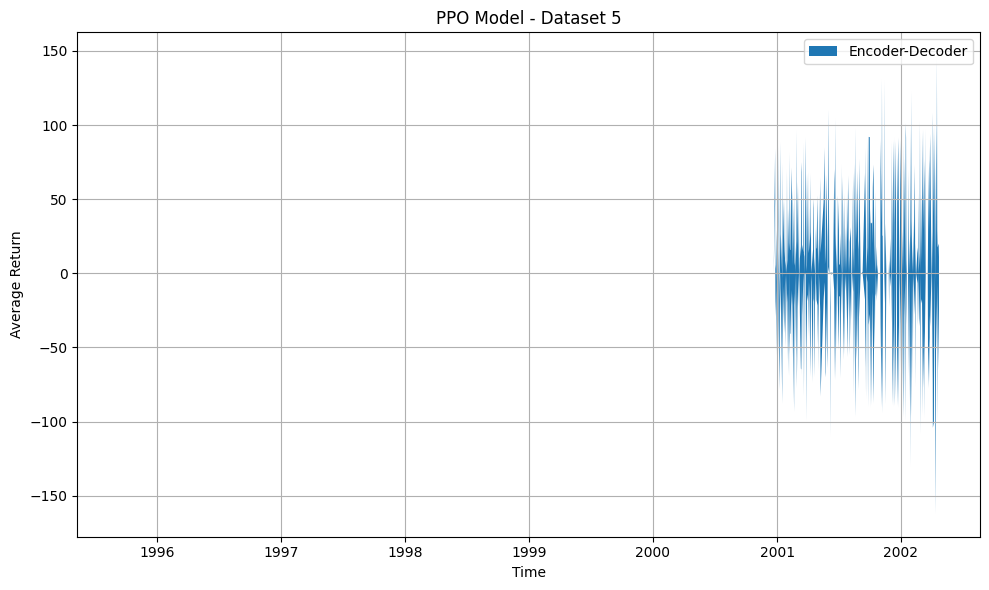

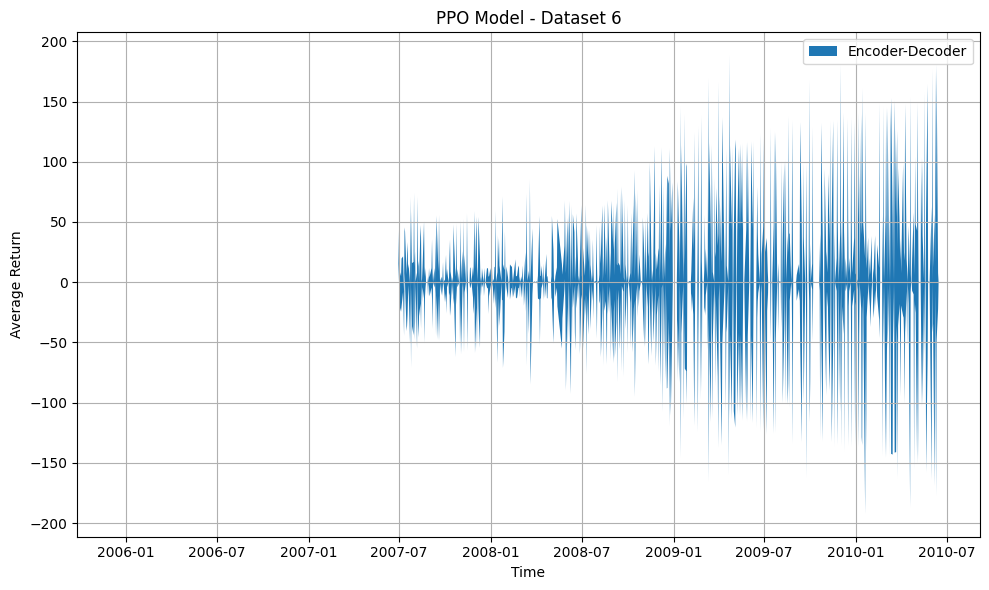

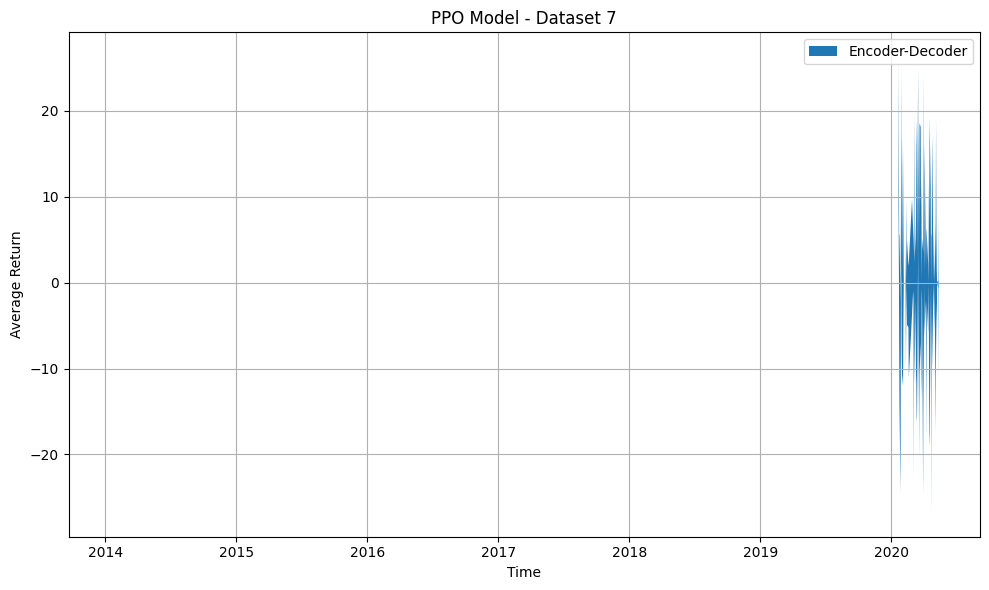

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Initialize dictionaries to store the returns for each model and dataset
returns_dict = {model: {i: [] for i in range(4, 8)} for model in ['DRL', 'PPO']}

# Iterate over the models (DRL, PPO), datasets, and folders
models = ['DRL', 'PPO']
folders = ['results 555', 'results 537', 'results 777',  'results 333',  'results 735']
for model in models:
    for folder in folders:
        for i in range(4, 8):
            dataset = i
            
            both_returns = pd.read_parquet(f"{folder}/{model}_both_orders_test_{dataset}.parquet")
            ae_returns = pd.read_parquet(f"{folder}/{model}_ae_orders_test_{dataset}.parquet")
            gauss_returns = pd.read_parquet(f"{folder}/{model}_gauss_orders_test_{dataset}.parquet")
            na_returns = pd.read_parquet(f"{folder}/{model}_na_orders_test_{dataset}.parquet")
            
            # Combine returns into a single DataFrame
            df_all = pd.concat([ae_returns['action'], both_returns['action'], gauss_returns['action'], na_returns['action'], na_returns['action']], axis=1)
            df_all.columns = ['autoencoder', "both", 'gauss', 'NA', 'benchmark']

            # Store the returns in the dictionary
            returns_dict[model][dataset].append(df_all)

# Calculate the mean returns across all folders for each model and dataset
avg_returns_dict = {model: {} for model in models}
u_std_returns_dict = {model: {} for model in models}
l_std_returns_dict = {model: {} for model in models}
for model in models:
    for i in range(4, 8):
        combined_df = pd.concat(returns_dict[model][i])
        u_std_returns_dict[model][i] = combined_df.groupby(combined_df.index).mean() + combined_df.groupby(combined_df.index).std()
        l_std_returns_dict[model][i] = combined_df.groupby(combined_df.index).mean() - combined_df.groupby(combined_df.index).std()
        avg_returns_dict[model][i] = combined_df.groupby(combined_df.index).mean()

# Plotting the average returns for each model and dataset separately
for model in models:
    for i in range(4, 8):
        plt.figure(figsize=(10, 6))
        
        plt.fill_between(u_std_returns_dict[model][i].index, u_std_returns_dict[model][i]['autoencoder'], l_std_returns_dict[model][i]['autoencoder'], label='Encoder-Decoder')
        #plt.fill_between(u_std_returns_dict[model][i].index, u_std_returns_dict[model][i], l_std_returns_dict[model][i], avg_returns_dict[model][i]['both'], label='Both')
        #plt.fill_between(u_std_returns_dict[model][i].index, u_std_returns_dict[model][i]['gauss'], l_std_returns_dict[model][i]['gauss'], label='MCDropout')
        #plt.fill_between(u_std_returns_dict[model][i].index, u_std_returns_dict[model][i]['NA'], l_std_returns_dict[model][i]['NA'], label='NA')

        # Calculate and plot the average of the averages of 'autoencoder' and 'gauss'
        #avg_returns_dict[model][i]['aggregated_agent'] = (avg_returns_dict[model][i]['autoencoder'] + avg_returns_dict[model][i]['gauss']) / 2
        #plt.plot(avg_returns_dict[model][i].index, avg_returns_dict[model][i]['aggregated_agent'], label='Aggregated Agent', linestyle='--')

        plt.title(f'{model} Model - Dataset {i}')
        plt.xlabel('Time')
        plt.ylabel('Average Return')
        plt.legend(loc='best')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


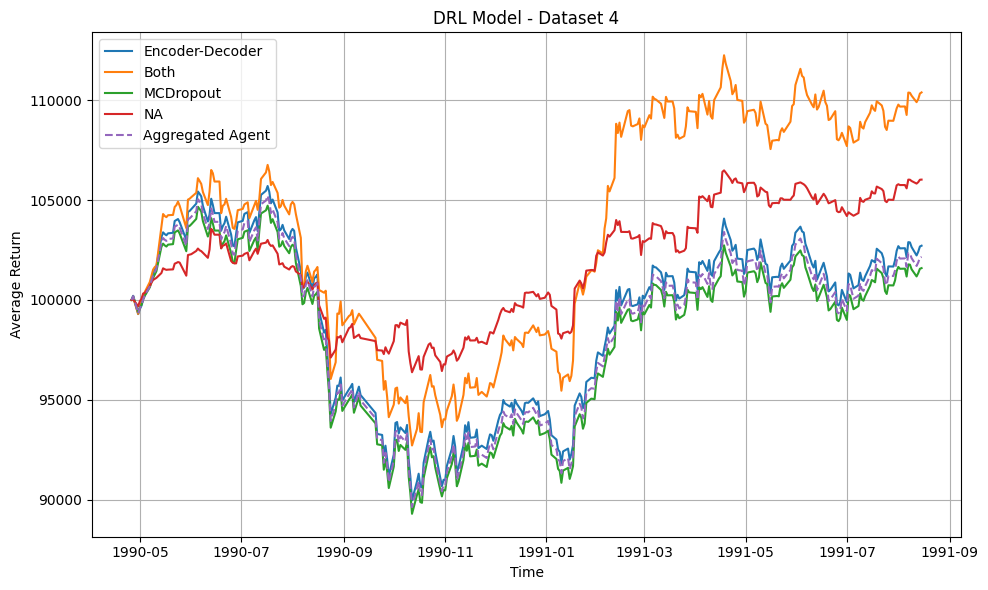

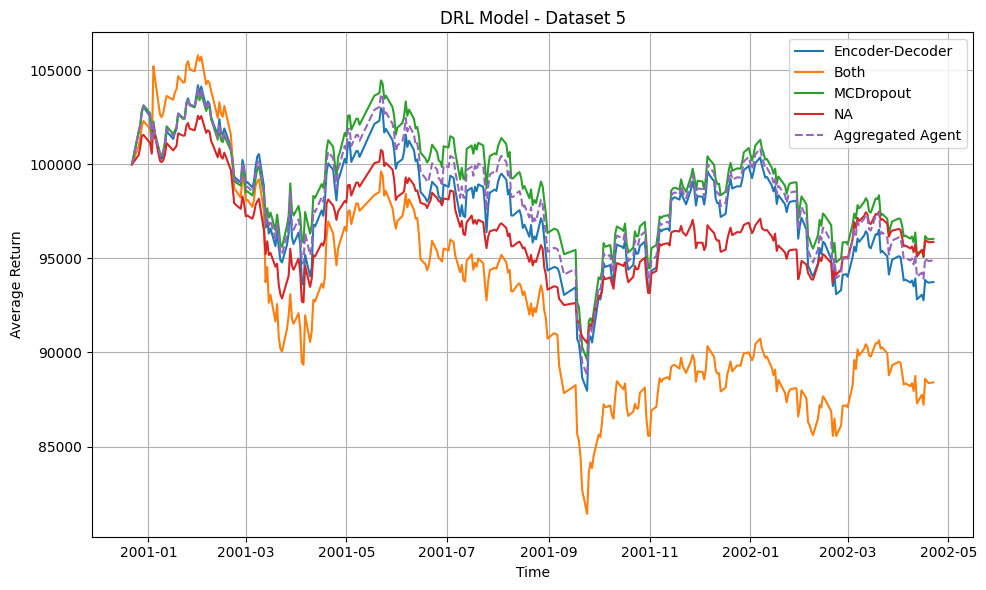

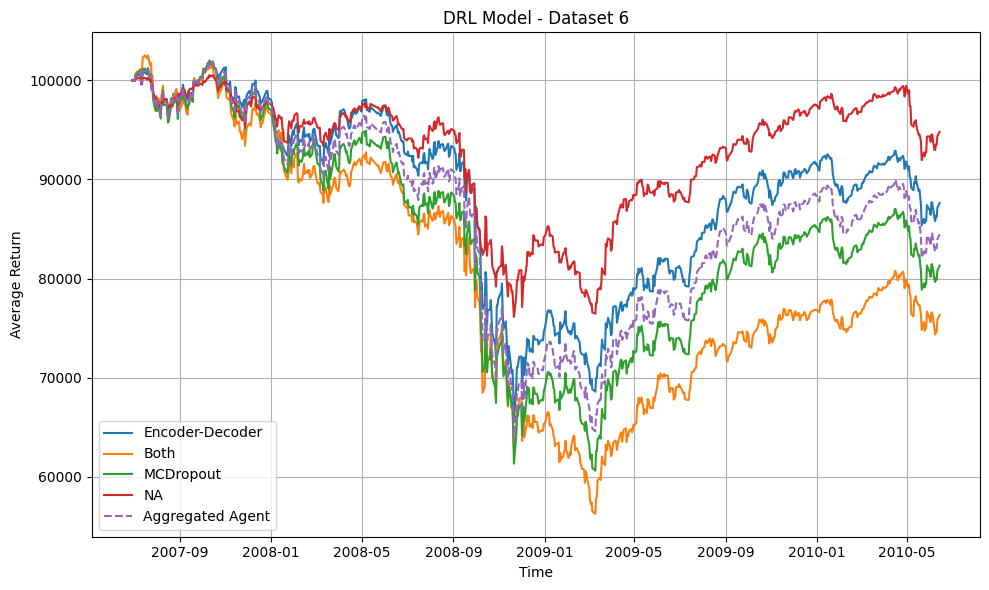

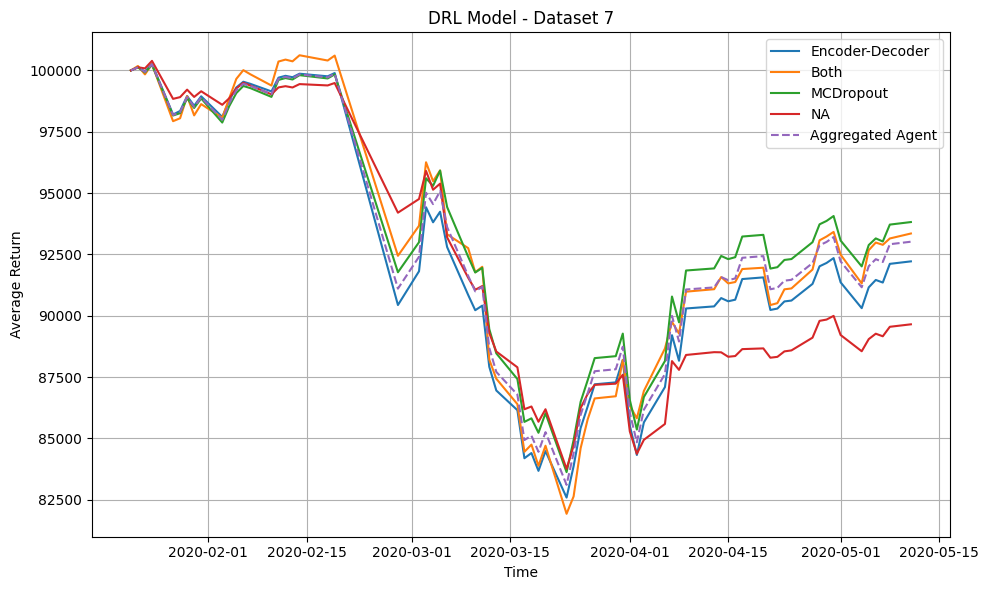

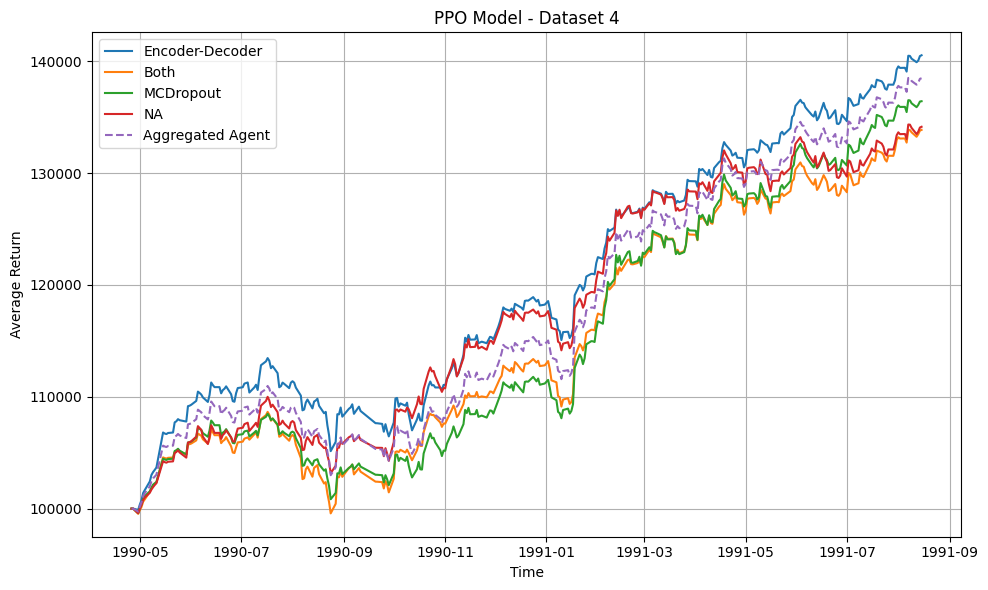

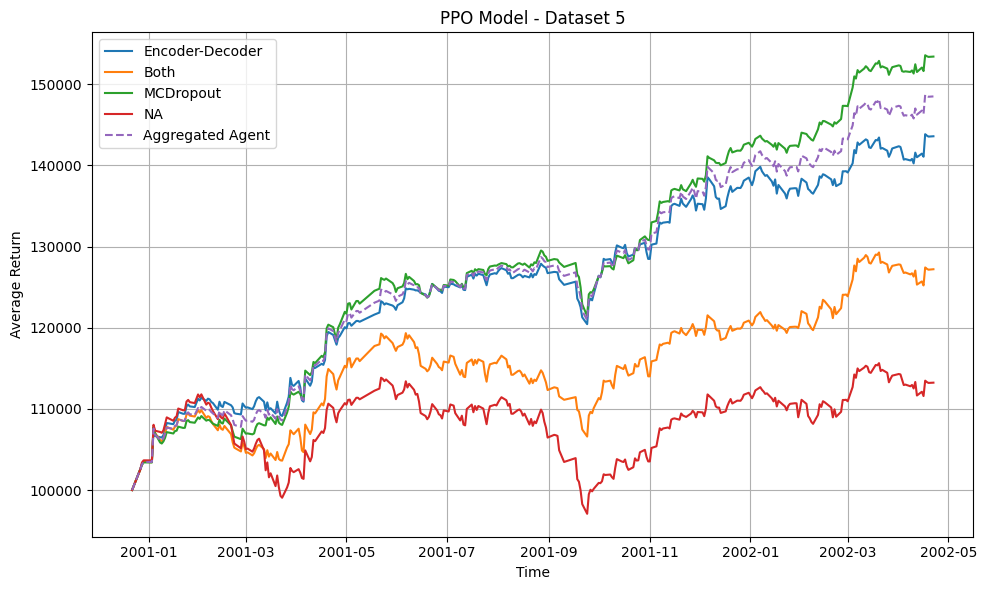

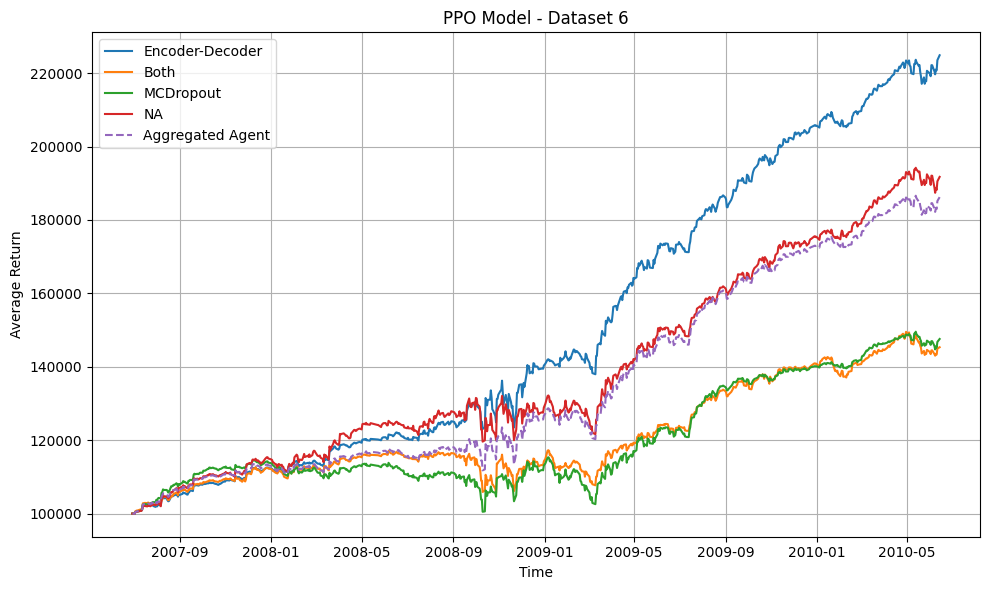

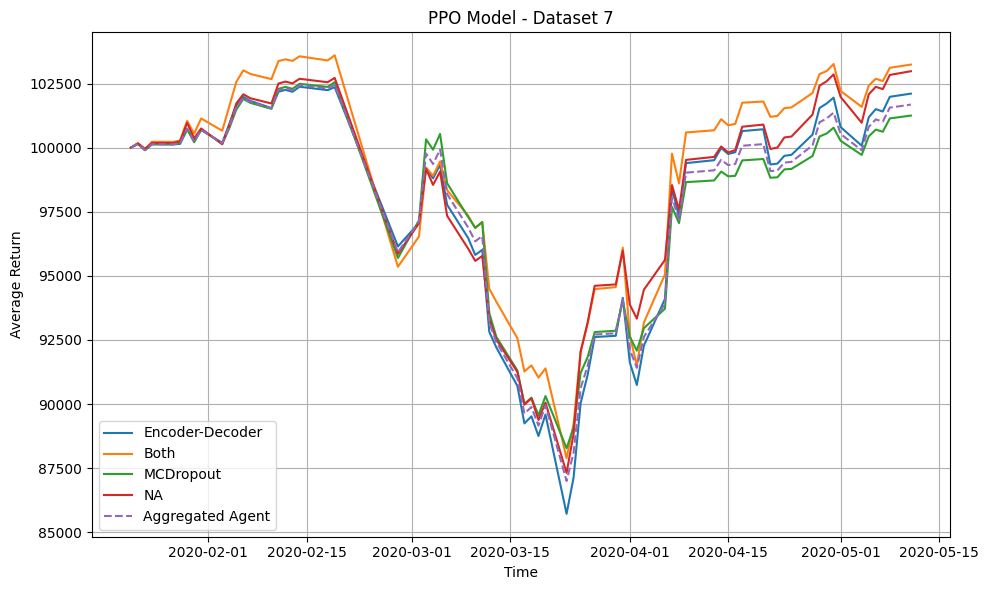

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Initialize dictionaries to store the returns for each model and dataset
returns_dict = {model: {i: [] for i in range(4, 8)} for model in ['DRL', 'PPO']}

# Iterate over the models (DRL, PPO), datasets, and folders
models = ['DRL', 'PPO']
folders = ['results 555', 'results 537', 'results 777',  'results 333',  'results 735']
for model in models:
    for folder in folders:
        for i in range(4, 8):
            dataset = i
            
            both_returns = pd.read_parquet(f"{folder}/{model}_both_returns_test_{dataset}.parquet")
            ae_returns = pd.read_parquet(f"{folder}/{model}_ae_returns_test_{dataset}.parquet")
            gauss_returns = pd.read_parquet(f"{folder}/{model}_gauss_returns_test_{dataset}.parquet")
            na_returns = pd.read_parquet(f"{folder}/{model}_na_returns_test_{dataset}.parquet")
            
            # Combine returns into a single DataFrame
            df_all = pd.concat([ae_returns['tf-agent'], both_returns['tf-agent'], gauss_returns['tf-agent'], na_returns['tf-agent'], na_returns['benchmark']], axis=1)
            df_all.columns = ['autoencoder', "both", 'gauss', 'NA', 'benchmark']

            # Store the returns in the dictionary
            returns_dict[model][dataset].append(df_all)

# Calculate the mean returns across all folders for each model and dataset
avg_returns_dict = {model: {} for model in models}
u_std_returns_dict = {model: {} for model in models}
l_std_returns_dict = {model: {} for model in models}
for model in models:
    for i in range(4, 8):
        combined_df = pd.concat(returns_dict[model][i])
        u_std_returns_dict[model][i] = combined_df.groupby(combined_df.index).mean() + combined_df.groupby(combined_df.index).std()
        l_std_returns_dict[model][i] = combined_df.groupby(combined_df.index).mean() - combined_df.groupby(combined_df.index).std()
        avg_returns_dict[model][i] = combined_df.groupby(combined_df.index).mean()

# Plotting the average returns for each model and dataset separately
for model in models:
    for i in range(4, 8):
        plt.figure(figsize=(10, 6))
        
        plt.plot(avg_returns_dict[model][i].index, avg_returns_dict[model][i]['autoencoder'], label='Encoder-Decoder')
        plt.plot(avg_returns_dict[model][i].index, avg_returns_dict[model][i]['both'], label='Both')
        plt.plot(avg_returns_dict[model][i].index, avg_returns_dict[model][i]['gauss'], label='MCDropout')
        plt.plot(avg_returns_dict[model][i].index, avg_returns_dict[model][i]['NA'], label='NA')

        # Calculate and plot the average of the averages of 'autoencoder' and 'gauss'
        avg_returns_dict[model][i]['aggregated_agent'] = (avg_returns_dict[model][i]['autoencoder'] + avg_returns_dict[model][i]['gauss']) / 2
        plt.plot(avg_returns_dict[model][i].index, avg_returns_dict[model][i]['aggregated_agent'], label='Aggregated Agent', linestyle='--')

        plt.title(f'{model} Model - Dataset {i}')
        plt.xlabel('Time')
        plt.ylabel('Average Return')
        plt.legend(loc='best')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


In [4]:
#def get_both(seed, file, dataset):
    #return (pd.read_parquet(file.format(seed, 'ae', dataset)) + pd.read_parquet(file.format(seed, 'gauss', dataset)))/2

def read_average_parquet(seeds, file, error_type, dataset):
    temp_list = []
    for seed in seeds:
        # if error_type == 'both':
        #     temp_list.append(get_both(seed, file, dataset))
        # else:
        temp_list.append(pd.read_parquet(file.format(seed, error_type, dataset)))
    total = sum(temp_list)
    average = total / len(temp_list)
    return average
seeds = [333,537,555,735,777]
error_type = 'both'
dataset = 4

read_average_parquet(seeds, "results {}/PPO_{}_orders_test_{}.parquet", error_type, dataset,)

,open,Cash,NAV,action
date,,,,
1990-04-26,0.0,100000.000000,100000.000000,0.0
1990-04-27,0.0,100000.000000,100000.000000,0.0
1990-04-30,120.0,60045.603349,99538.801591,120.0
1990-05-01,195.8,35096.571805,99867.209415,75.8
1990-05-02,195.6,35162.725187,100150.825187,-0.2
...,...,...,...,...
1991-08-12,178.2,64266.571793,133249.571183,17.8
1991-08-13,254.8,34610.981653,133478.474853,76.6
1991-08-14,204.4,54165.233478,133803.560480,-50.4


In [5]:

from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeClassifier
from lineartree import LinearTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

def get_importances(seeds, error_type, dataset):
    error_dict = {'ae': ['gauss_score'], 'gauss':['errors'], 'na': ['errors', 'gauss_score']}
    trade = pd.concat([pd.read_parquet(f"datasets/rl_val_dataset{dataset}.parquet"),pd.read_parquet(f"datasets/rl_test_dataset{dataset}.parquet")])
    trade = trade.drop(columns=['TEDRATE error', 'AAAFF error', 'DTB3 error',
        'S&P 500 COMPOSITE - DS DIVIDEND YIELD error', 'SnP PRICE error']+ error_dict[error_type])

    trade = trade.set_index('date', drop=True)
    actions = read_average_parquet(seeds, "results {}/PPO_{}_orders_test_{}.parquet", error_type, dataset,)[['Cash', 'NAV', 'action']]

    trade = trade.join(actions)
    trade['shares'] = trade['action'].cumsum()
    trade.loc[trade['action'] <= 0, 'pct'] = (trade['action'] / trade['shares'].shift(1))
    trade.loc[trade['action'] > 0, 'pct'] = (trade['action'] * trade['close'] / (trade['Cash'].shift(1)))
    
    def custom_round(value):
        possible_values = np.array([0, 0.25, 0.5, 0.75, 1, -1, -0.75, -0.5, -0.25])
        rounded_value = possible_values[np.abs(possible_values - (value)).argmin()]
        return rounded_value
    
    trade['pct'] = trade['pct'].apply(custom_round)
    trade['pct'] = trade['pct'].astype('string')
    trade.action = trade.action.fillna(0)
    trade = trade.dropna()
    X = trade.drop(columns=['action','tic','pct','shares','Cash','NAV'])
    y = trade[['pct']]
    error_dict = {'ae': 'errors', 'gauss':'gauss_score', 'na': ['errors', 'gauss_score']}
    X_old = X
    scaler = StandardScaler()
    X = scaler.fit_transform(X, y)
    parameters = {'base_estimator__alpha':[1, 5, 10], 'max_depth':[3, 5, 10]}
    search = GridSearchCV(LinearTreeRegressor(Ridge()), parameters, n_jobs=-1)
    search.fit(X,y)
    clf = LinearTreeRegressor(base_estimator=Ridge(alpha=search.best_params_['base_estimator__alpha']),  criterion='mse', max_depth=search.best_params_['max_depth'])
    clf.fit(X, y)
    def get_feature_importances_for_all_actions(clf, X):
        feature_importances_all = []
        
        for i in range(len(X)):
            # Predict the leaf node for the current sample
            leaf_node = clf.apply(X[i].reshape(1, -1))[0]
            
            # Extract the model in the leaf node
            model = clf.summary()[leaf_node]['models']
            
            # Assuming it's a regression task, access the coefficients
            coef = model.coef_
            
            # Calculate contributions for the current sample
            contributions = coef * X[i]
            
            # Normalize the contributions to sum to 1 (absolute values)
            feature_importances = contributions / np.sum(np.abs(contributions))
            
            feature_importances_all.append(feature_importances)
        return np.array(feature_importances_all)
    all_feature_importances = get_feature_importances_for_all_actions(clf, X)
    df_all_feature_importances = pd.DataFrame(all_feature_importances, columns=X_old.columns)
    df_all_feature_importances['pct'] =  y.reset_index()['pct'].astype('float')
    return df_all_feature_importances

In [6]:
dataset_dict = {4:"1990", 5:"2001", 6:"2008", 7:"2020" }
error_dict = {'ae': "AutoEncoder", "gauss": "MCDropout", "na":"NA"}

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

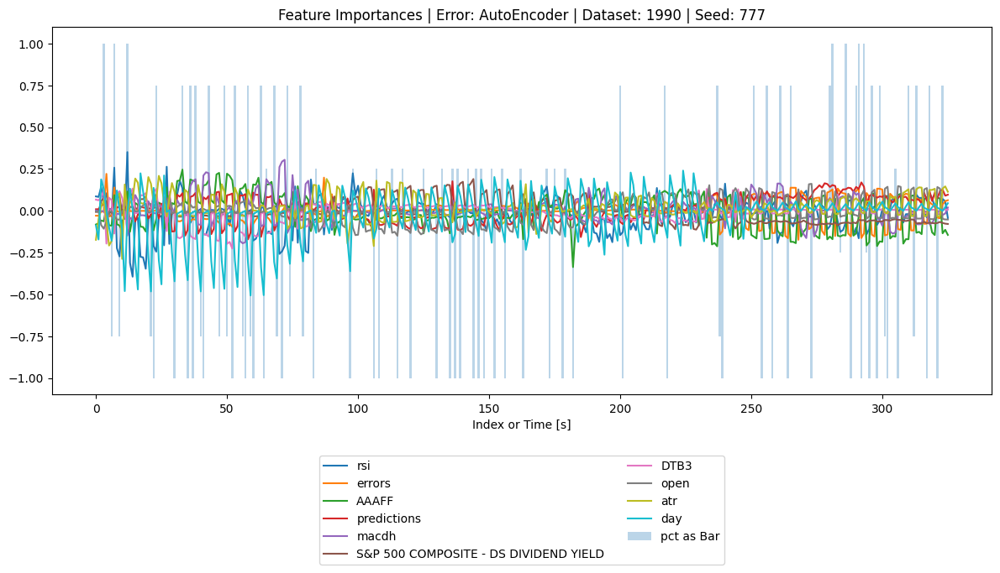

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

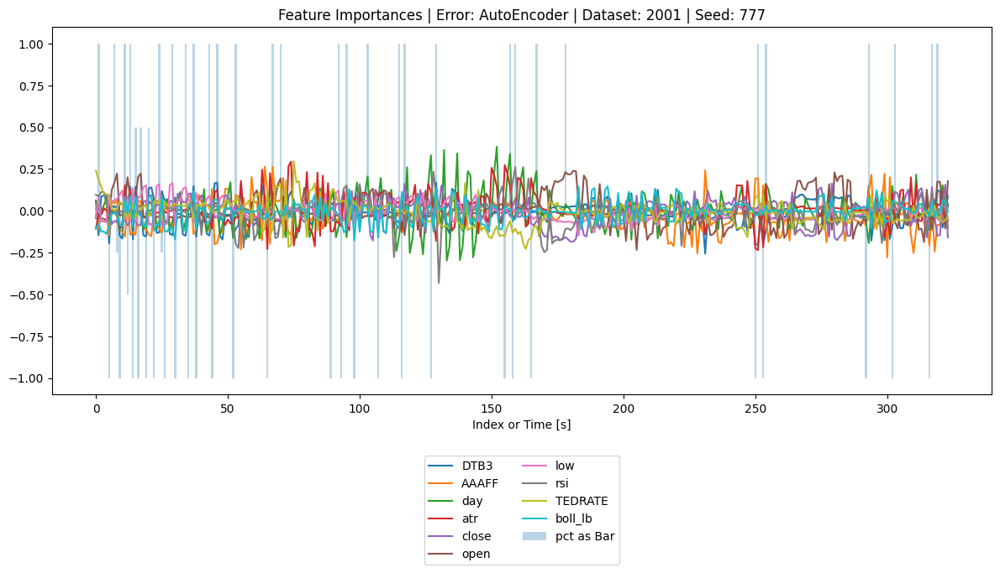

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

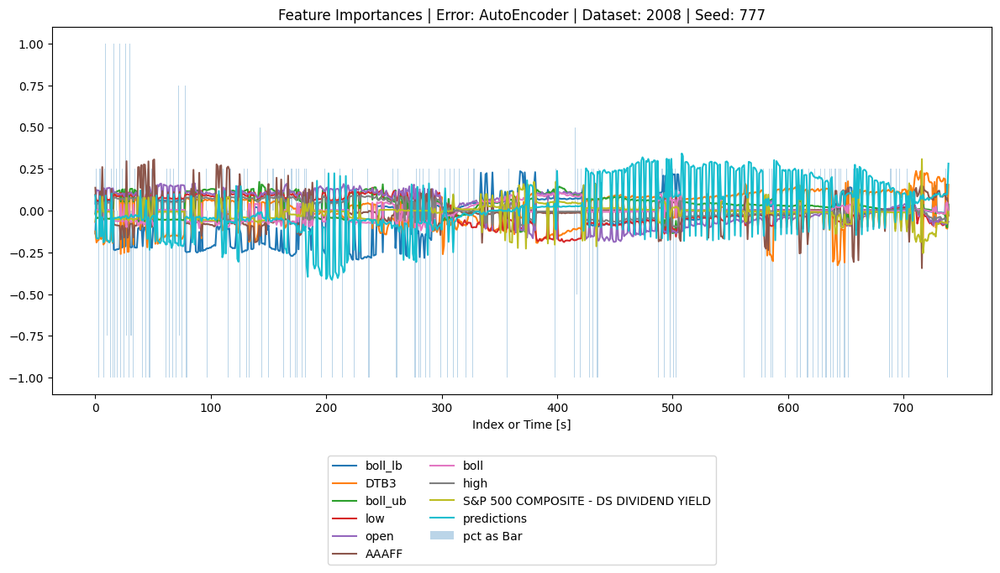

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

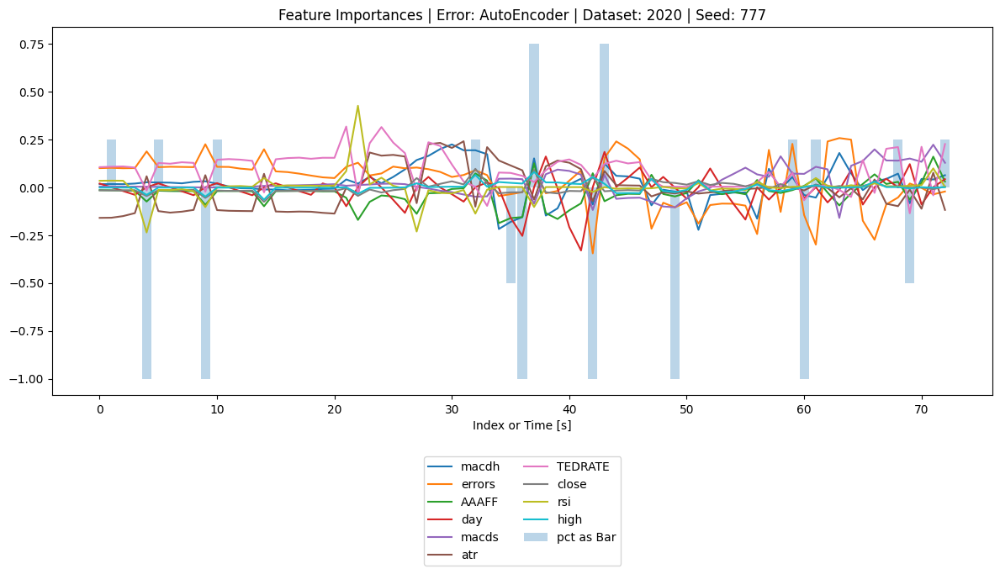

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

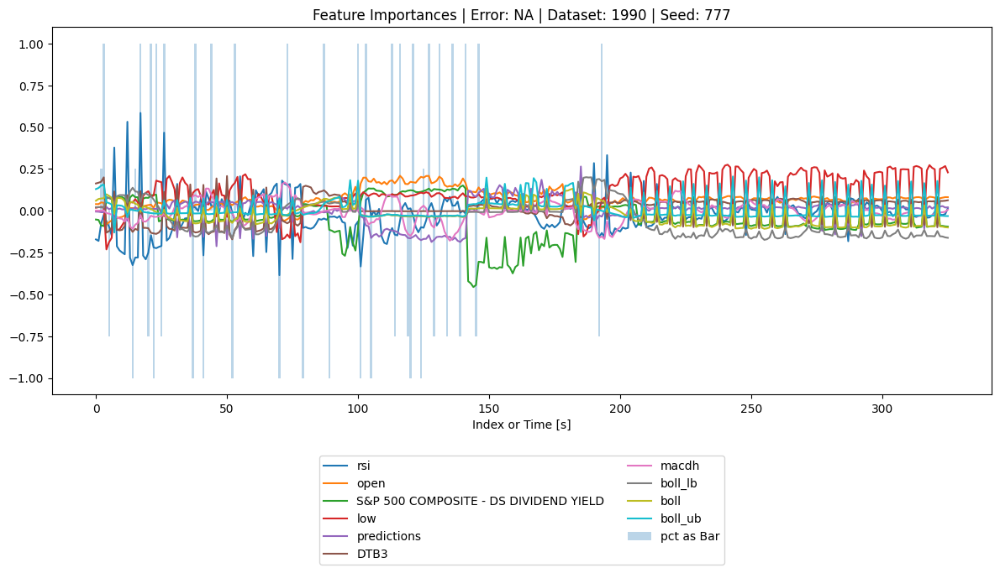

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

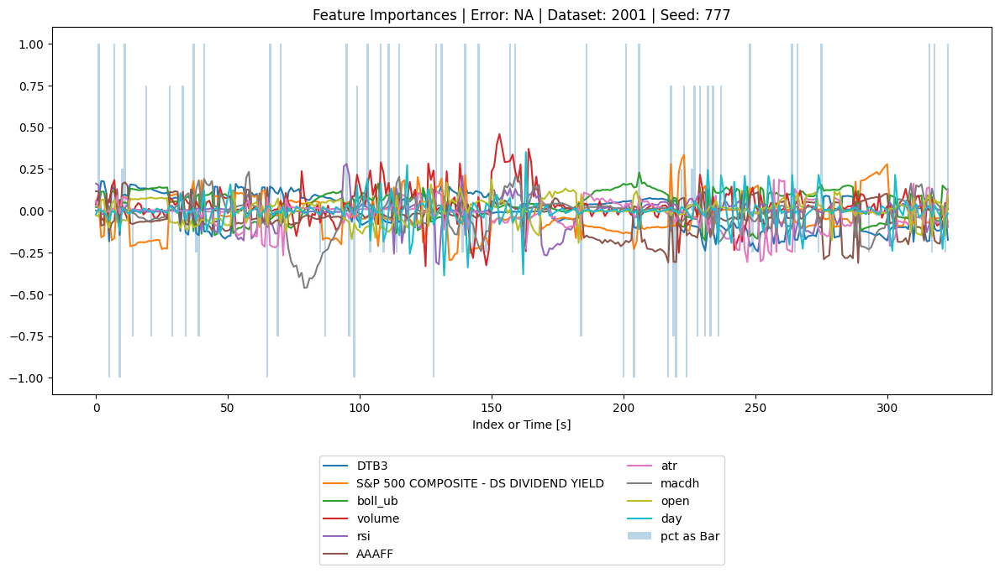

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

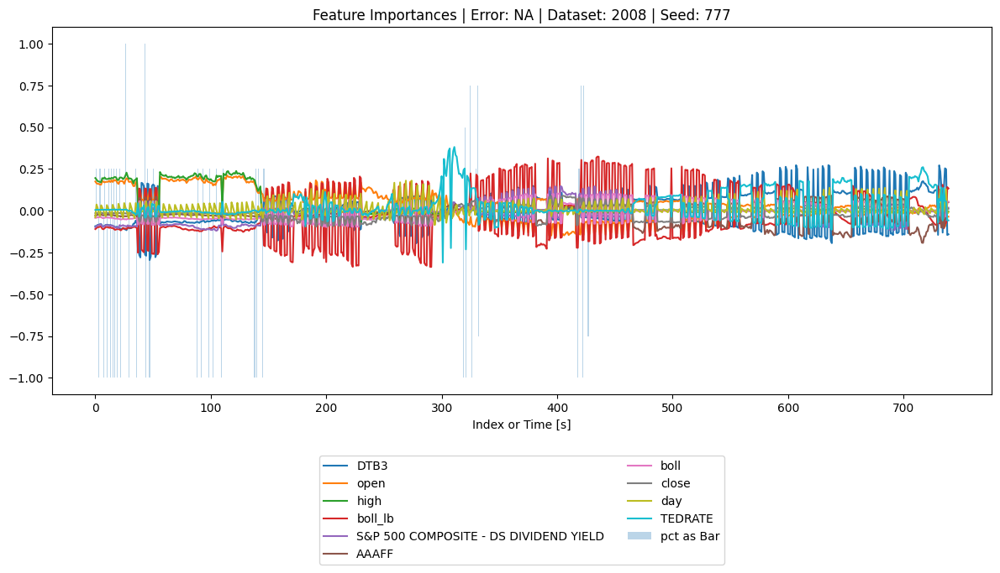

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

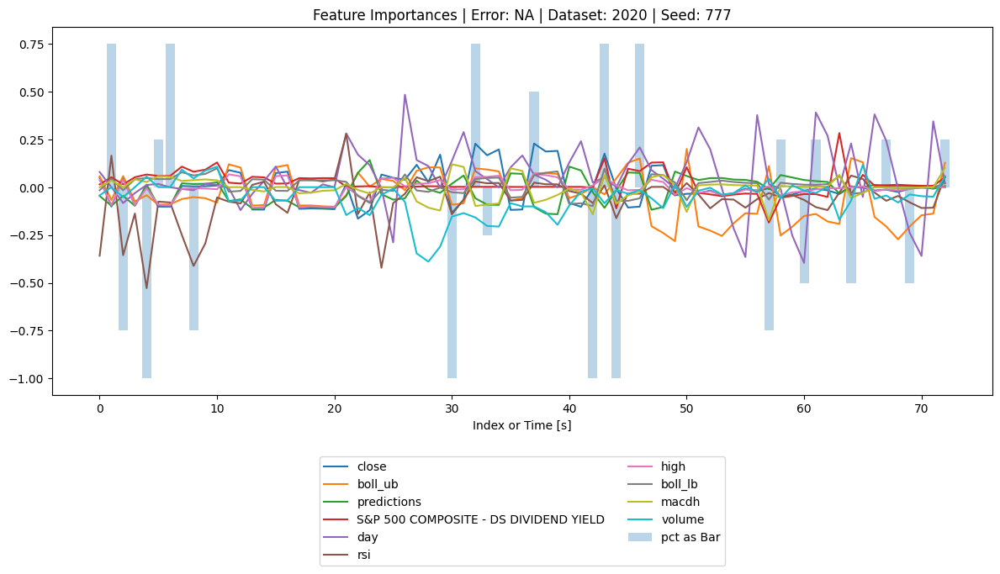

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

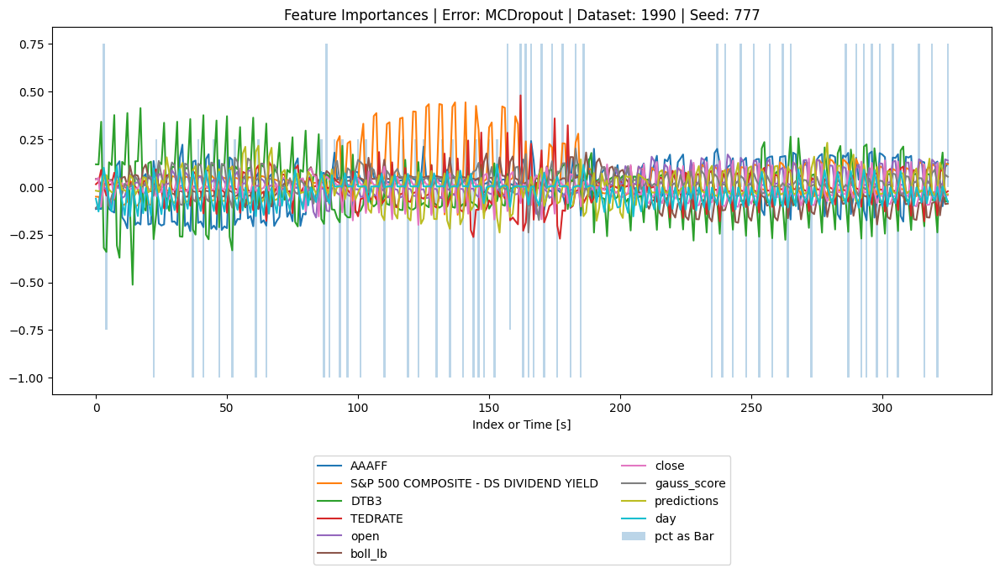

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

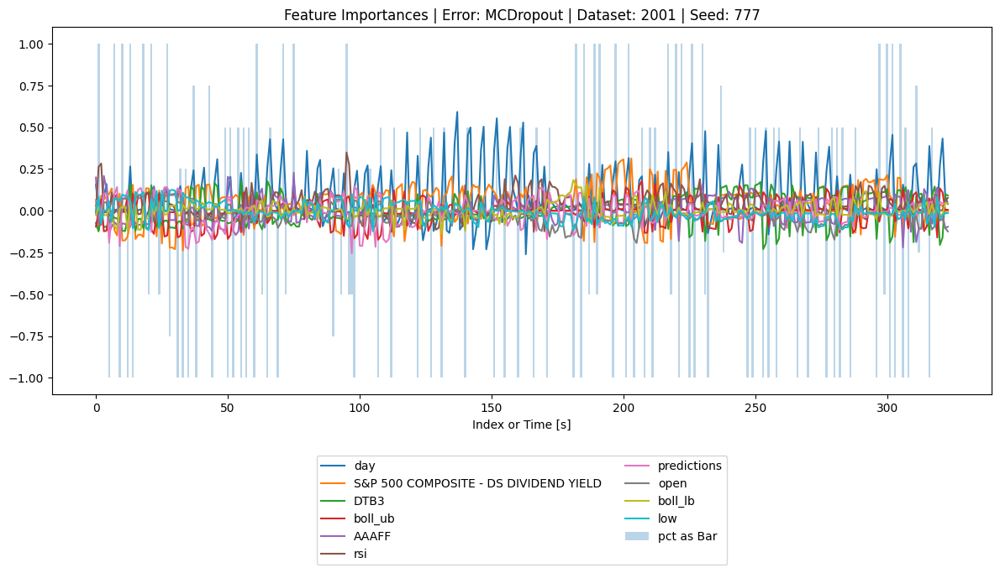

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

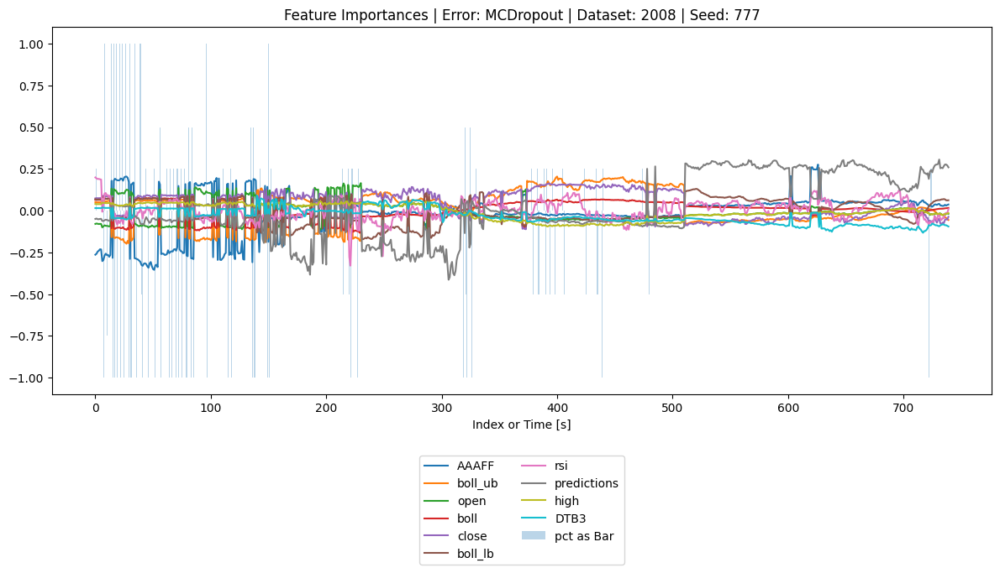

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

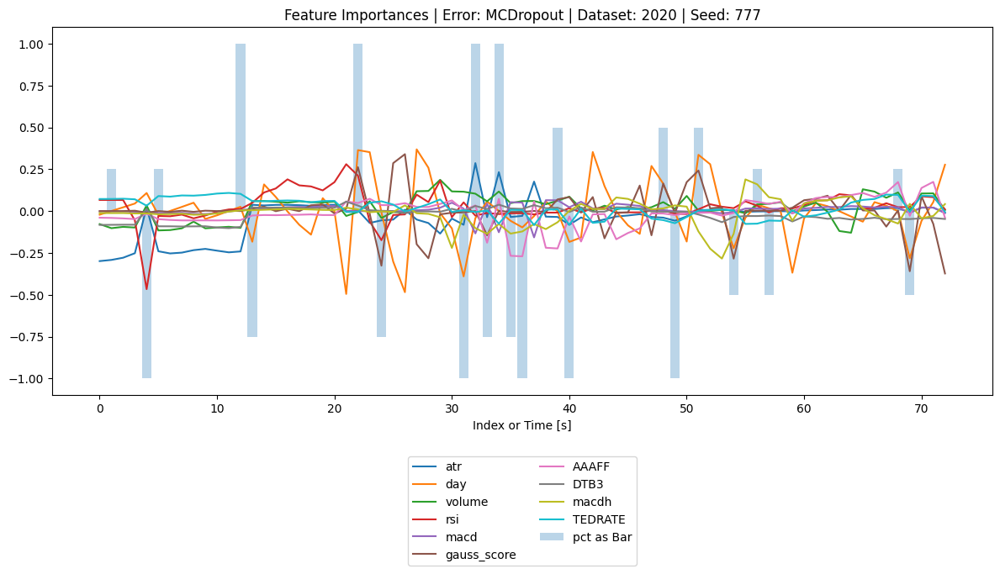

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

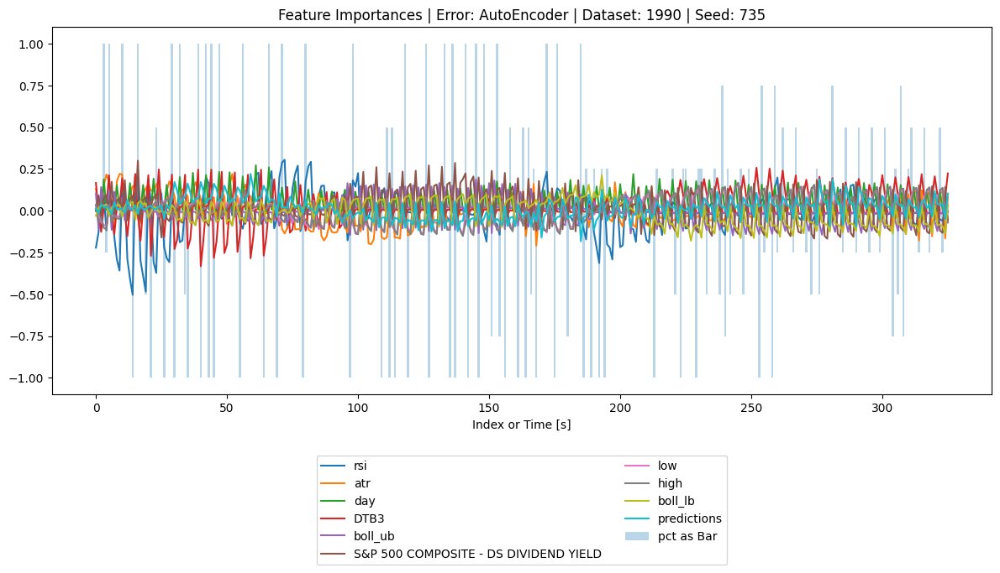

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

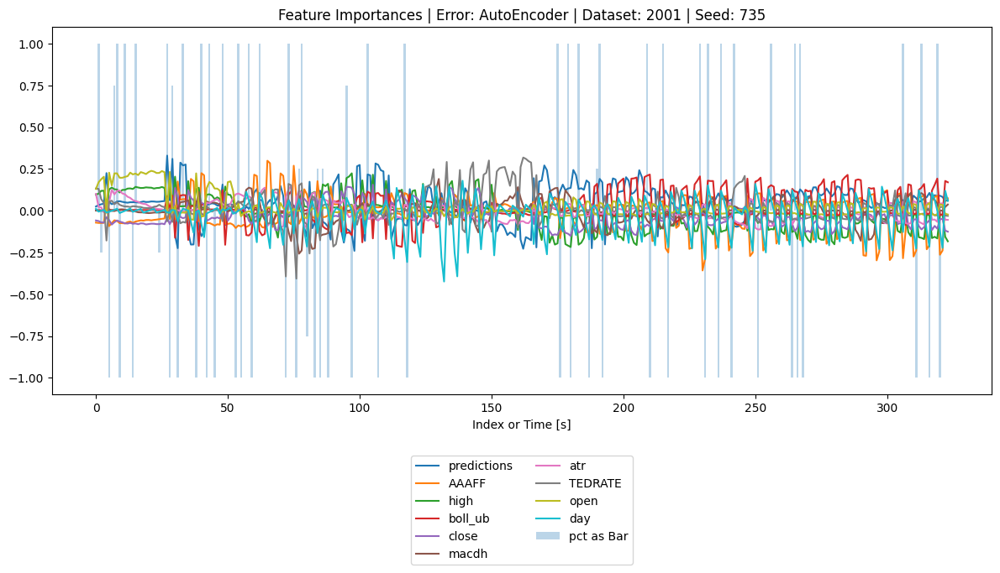

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

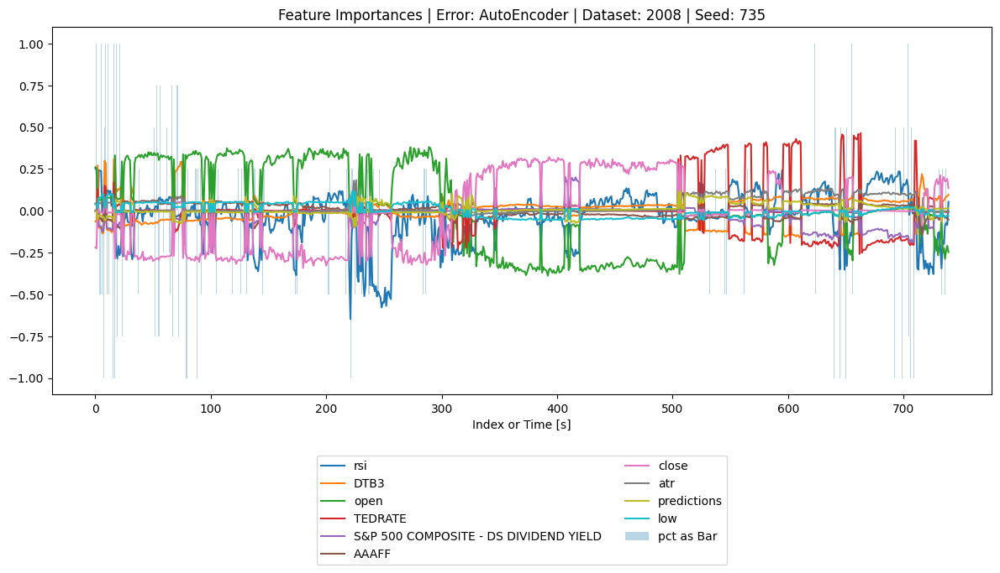

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

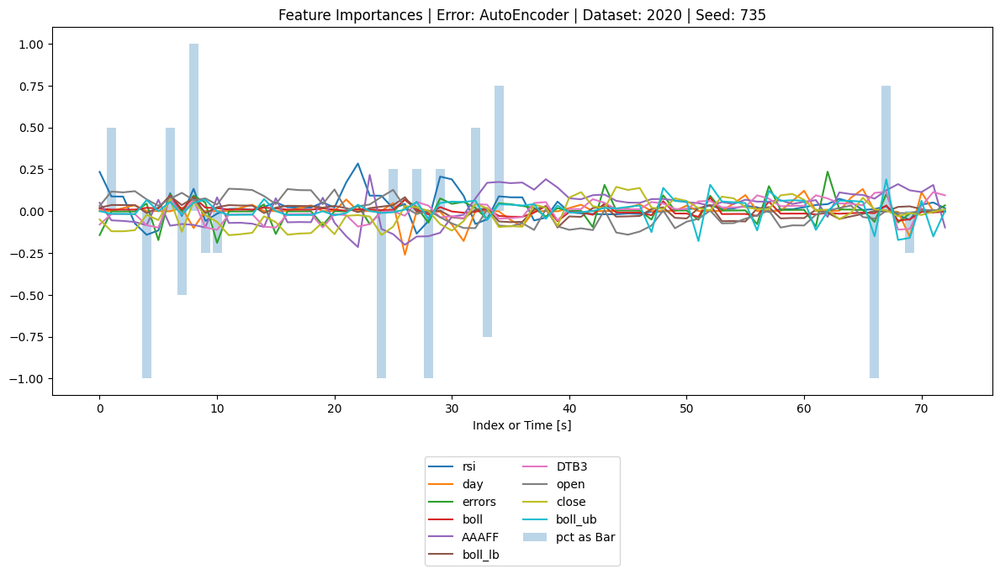

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

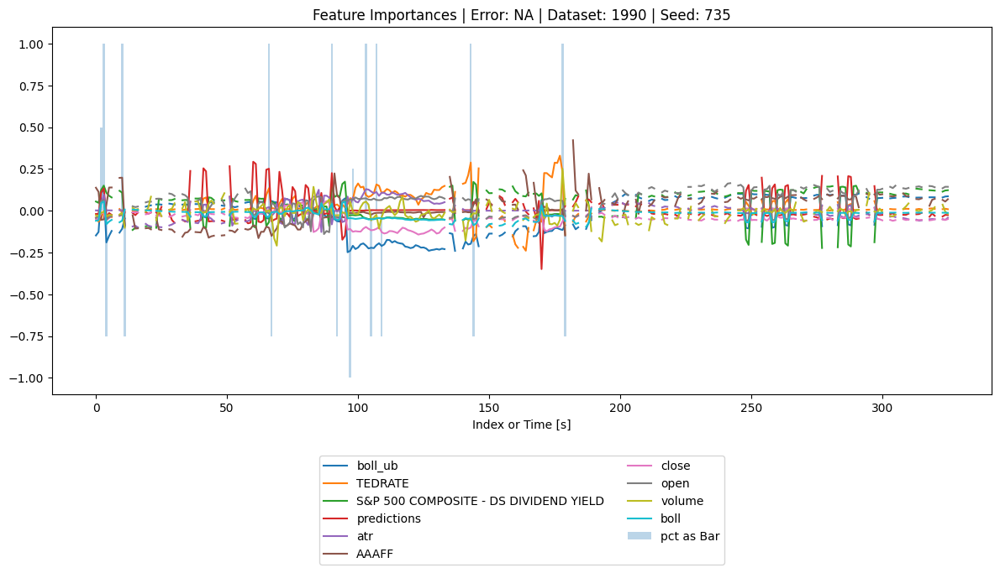

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

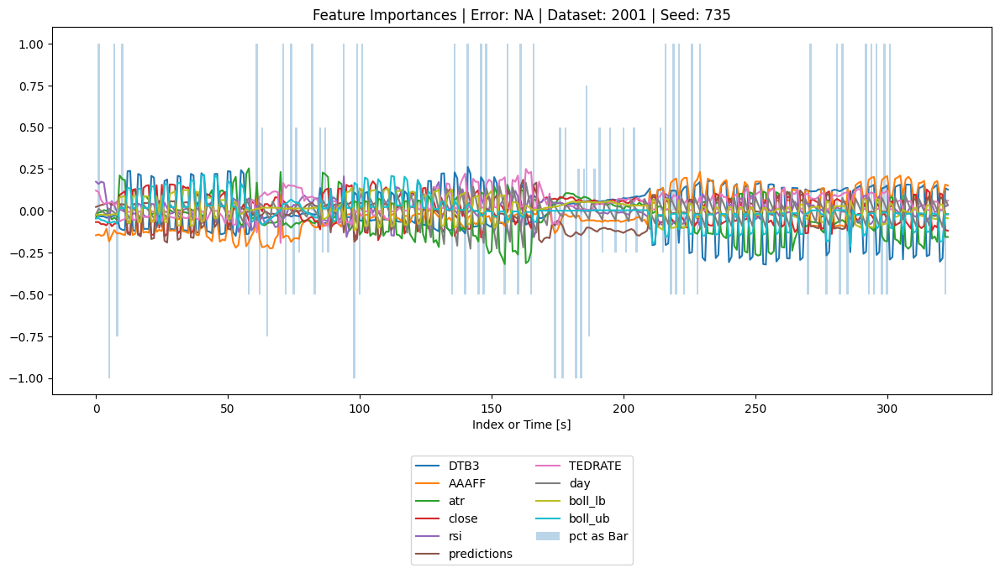

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

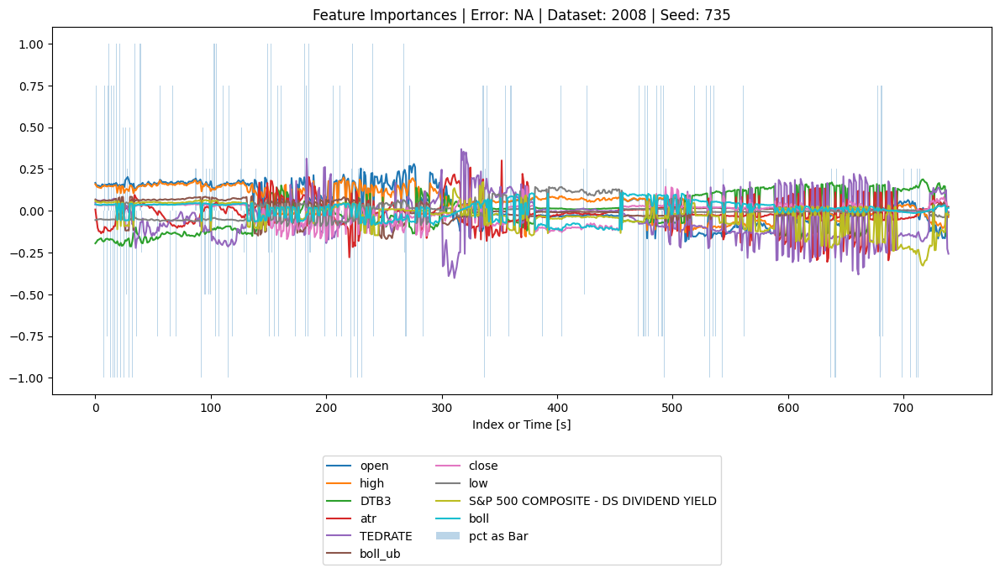

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

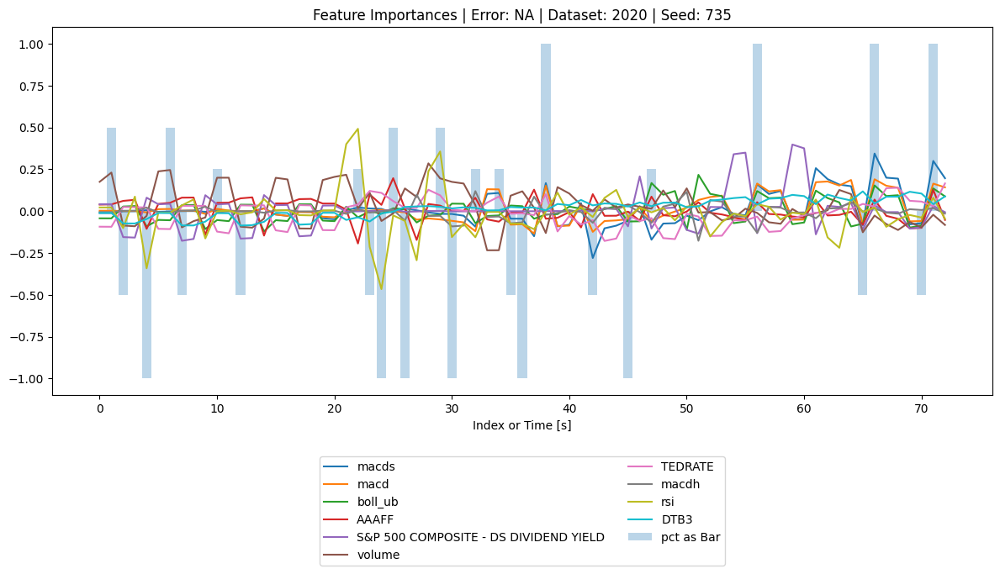

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

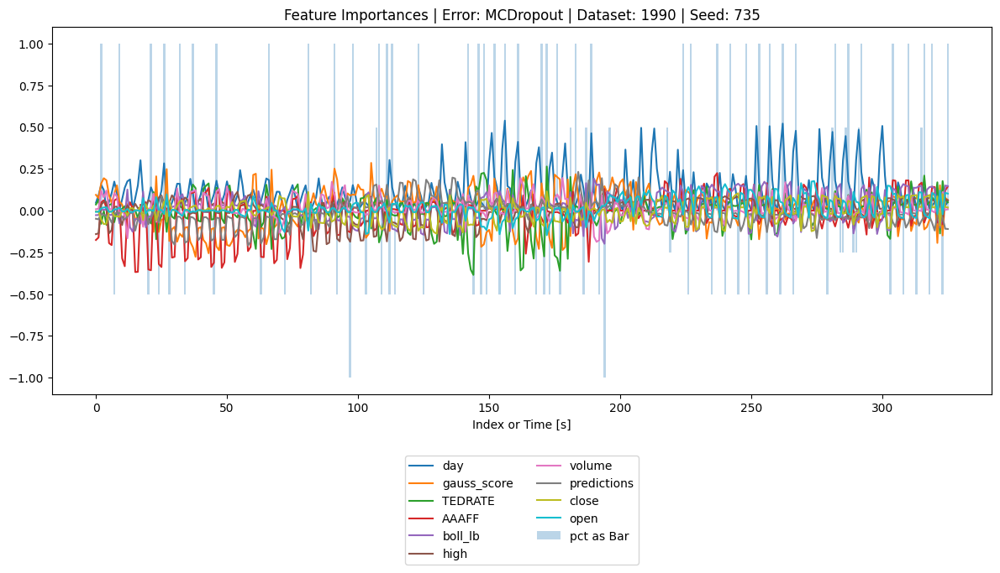

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

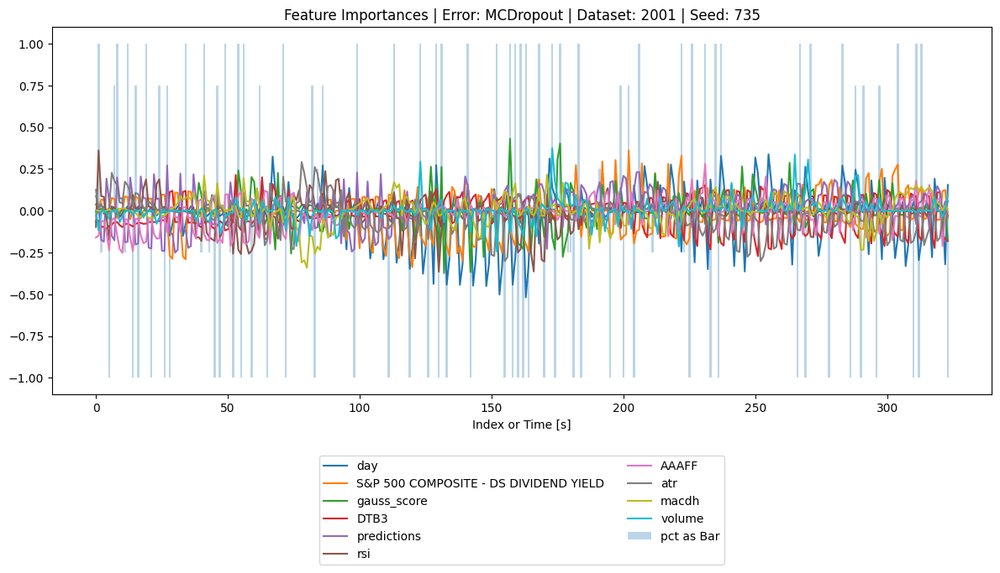

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

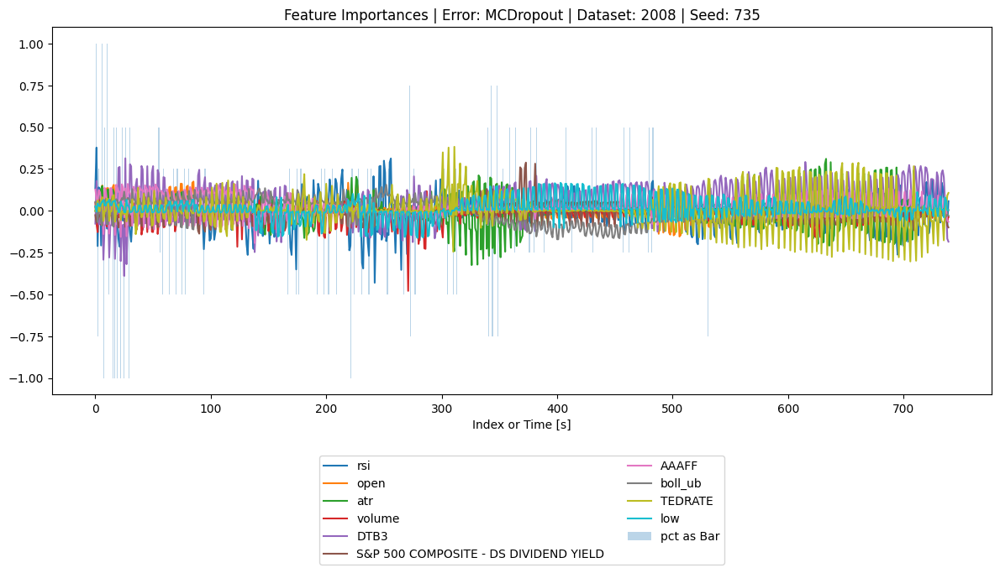

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

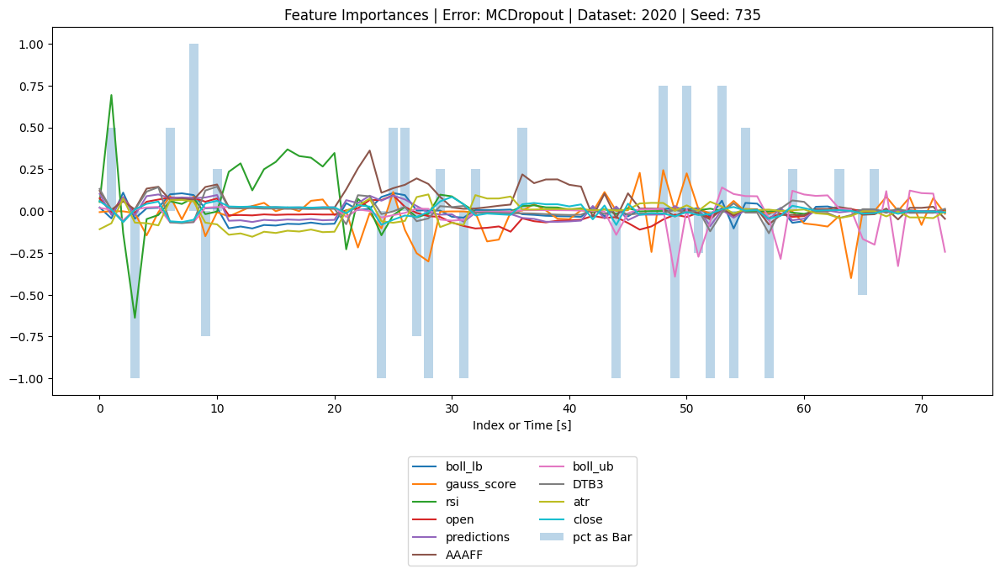

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

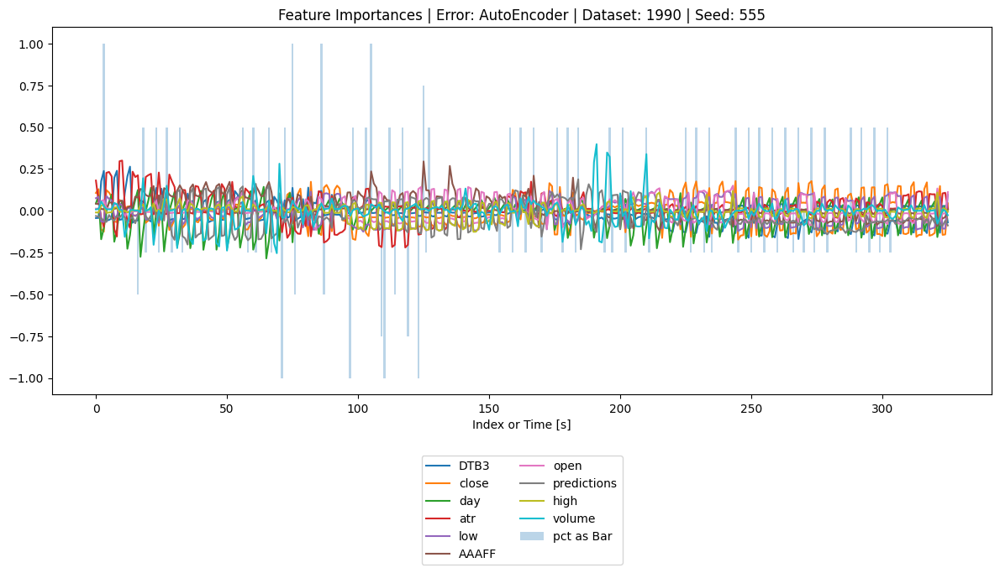

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

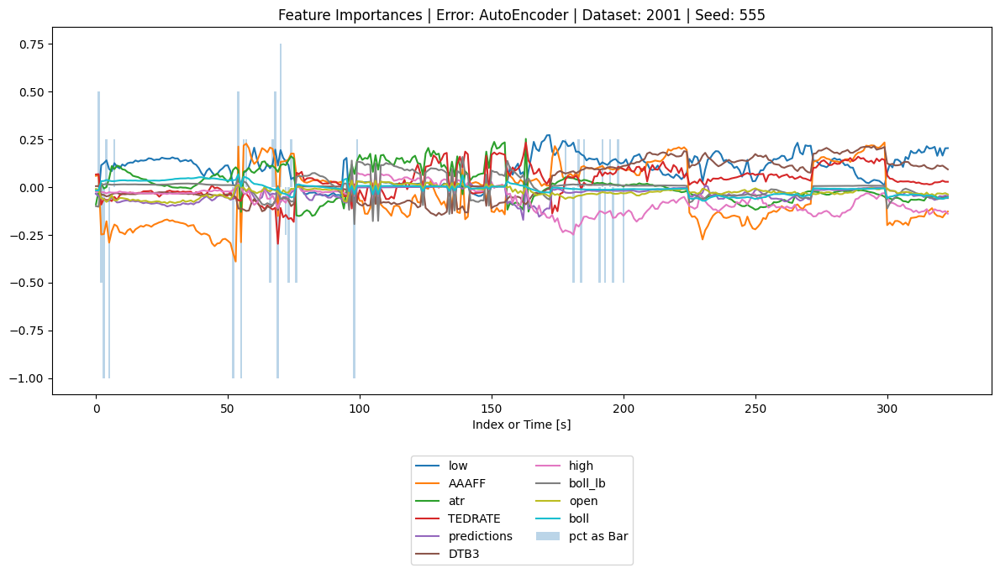

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

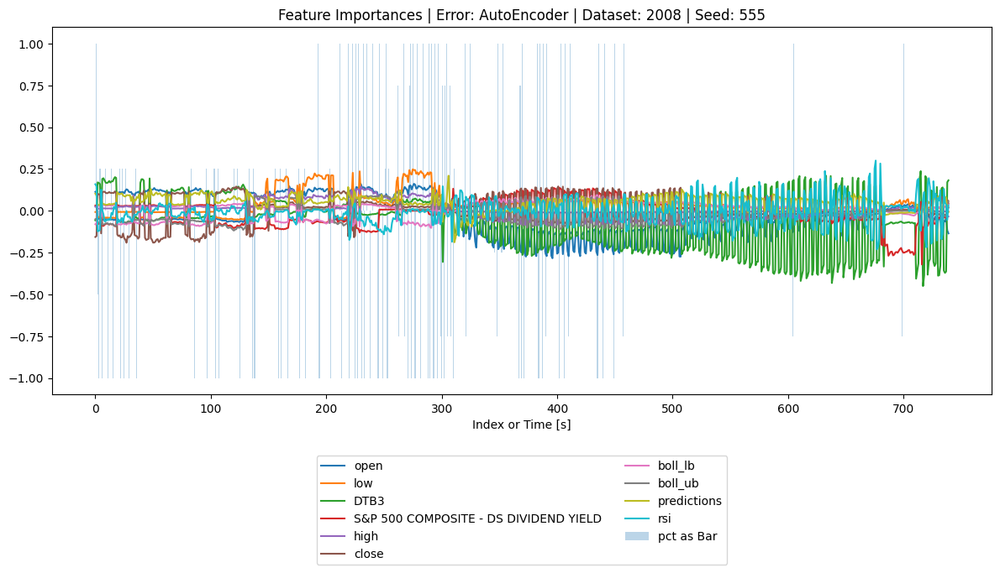

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

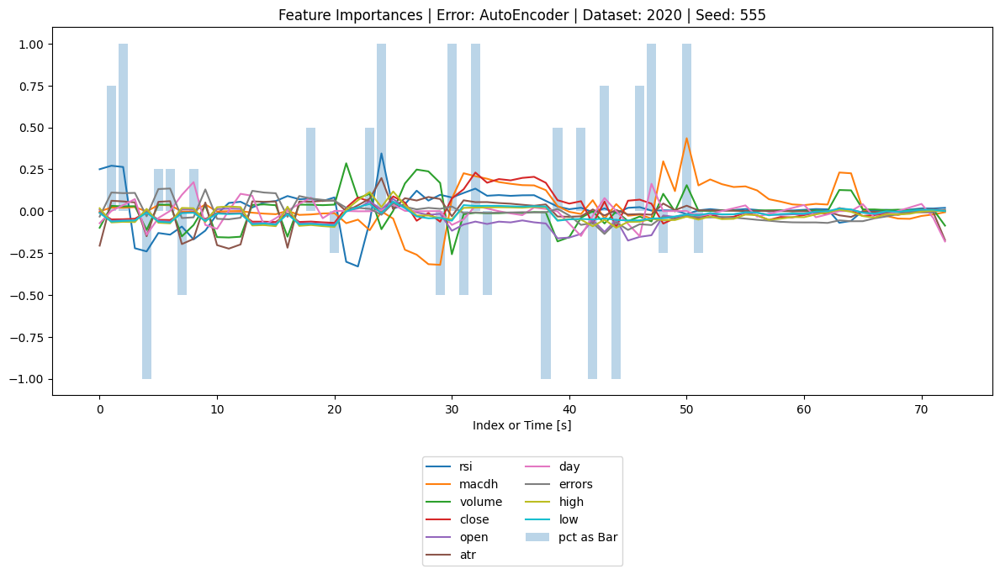

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

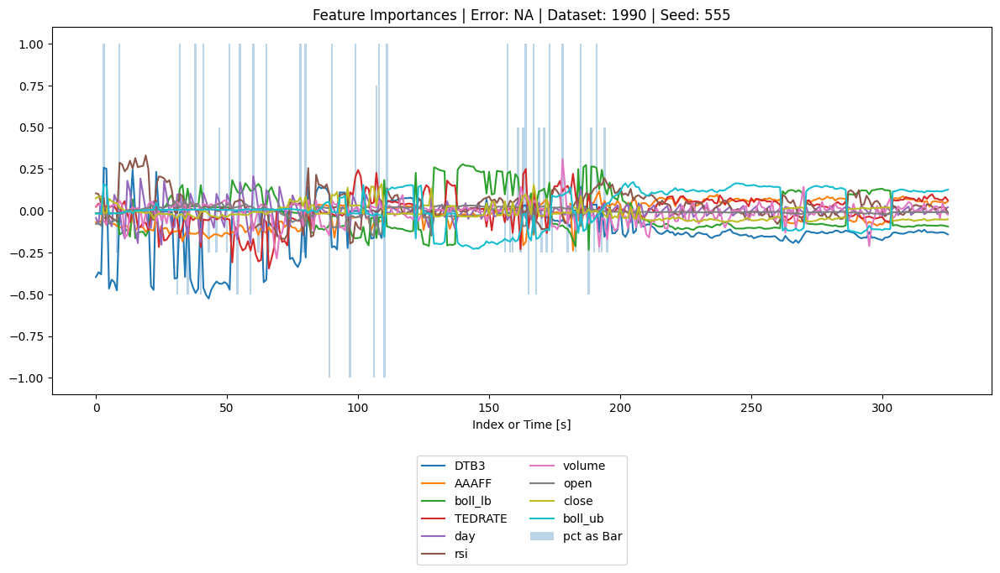

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

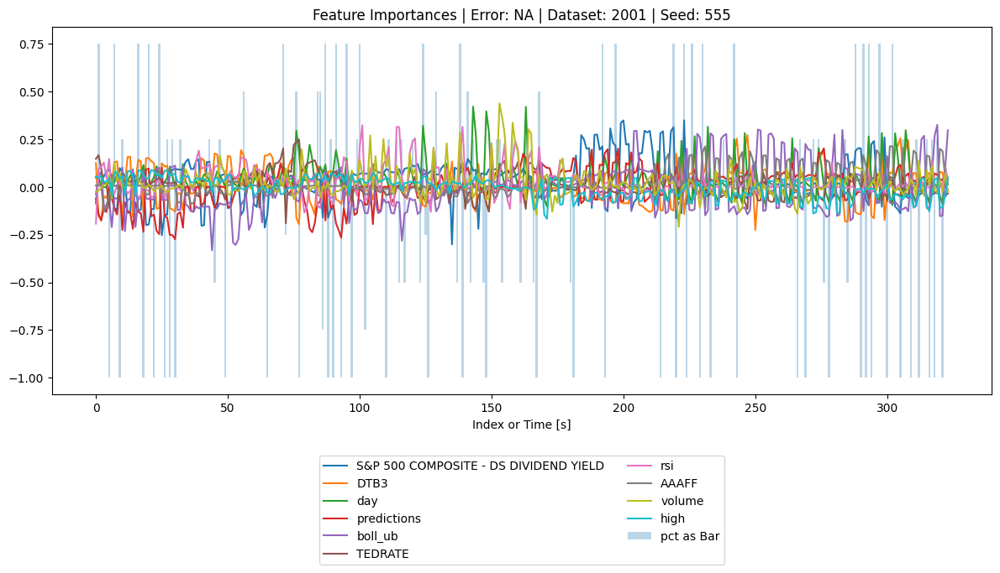

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

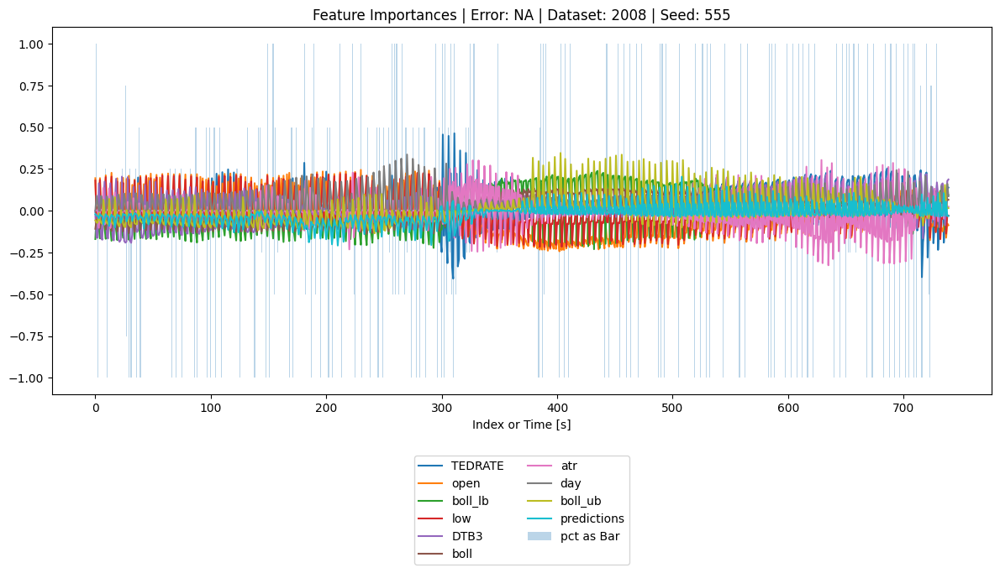

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

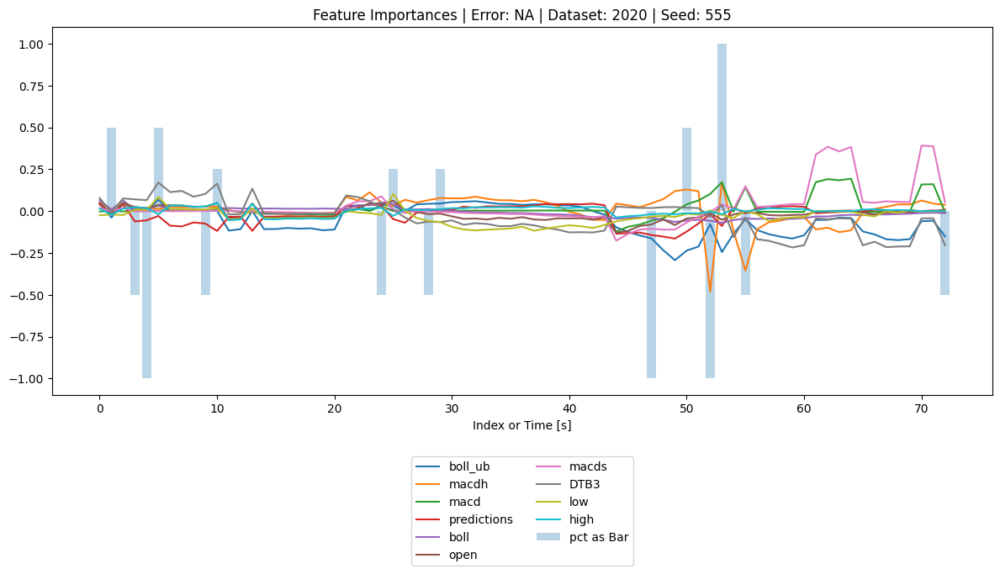

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

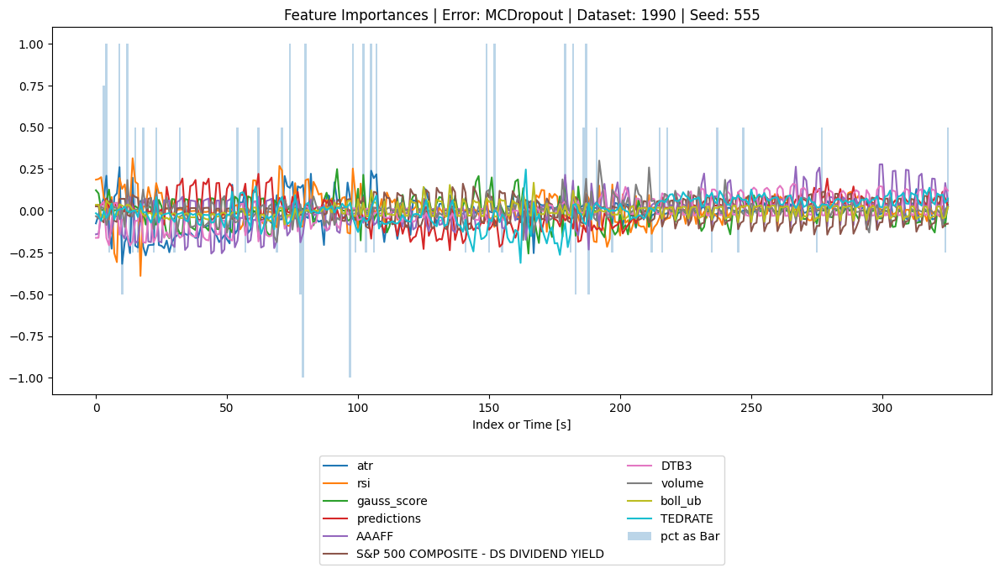

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

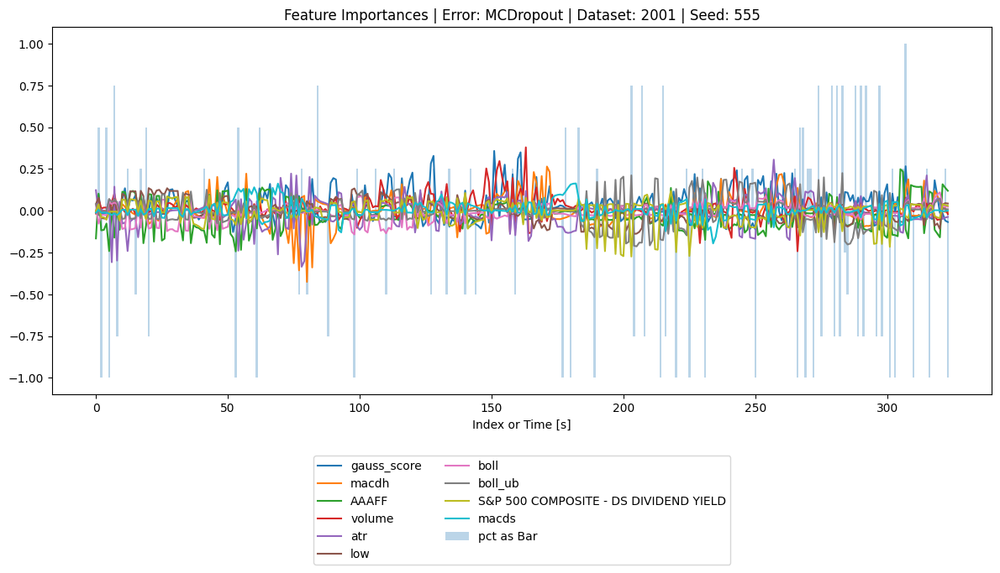

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

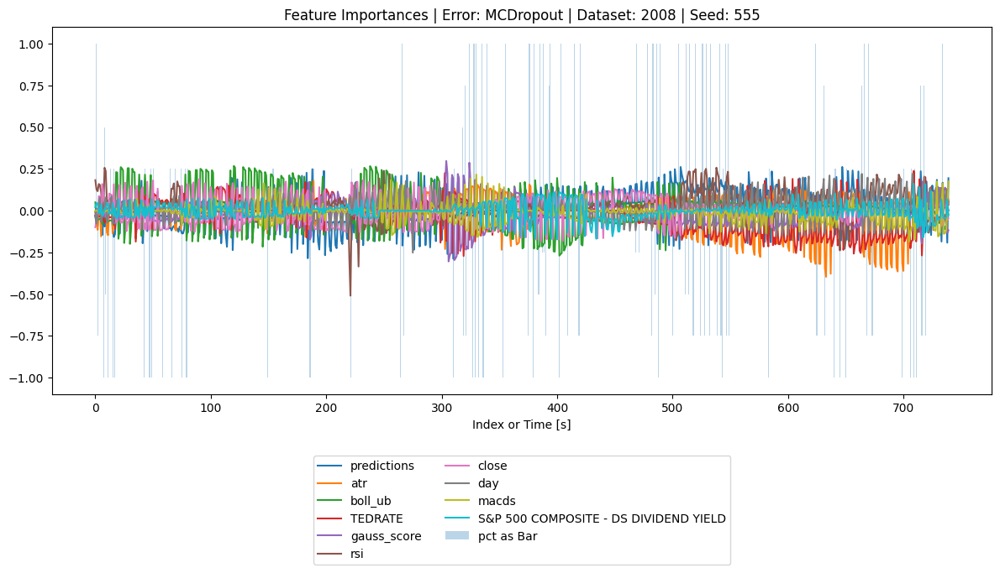

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

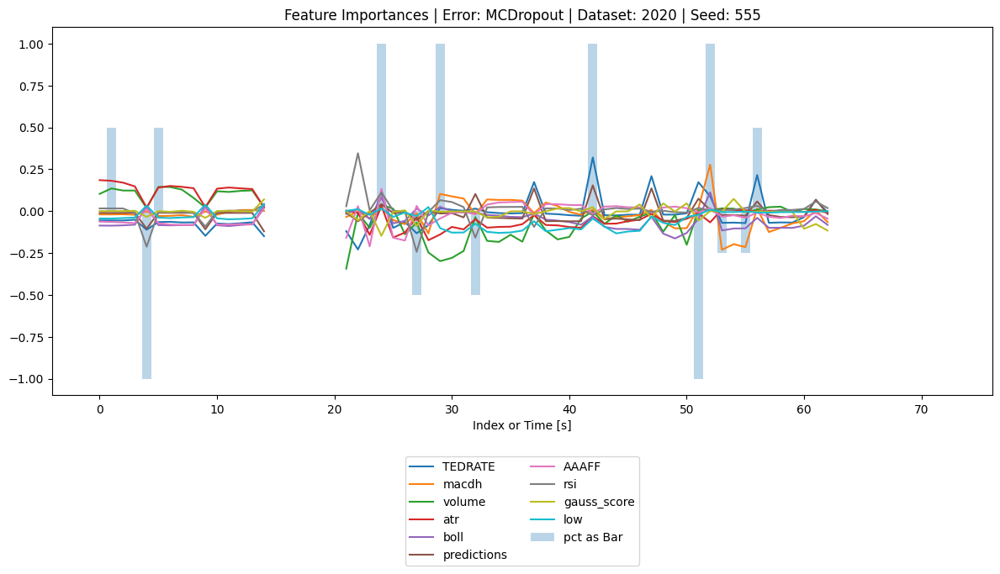

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

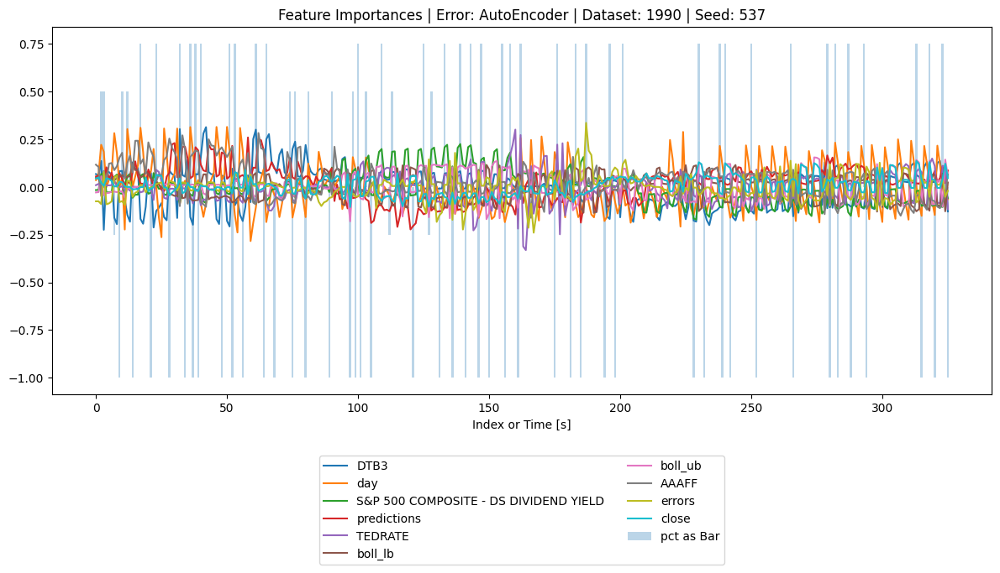

/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/base.py", line 761, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/justin/opt/anaconda3/envs/ureca_env/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 214, in wrapper
    return func(*args, **kwargs)
  File "/Users/just

In [7]:
import itertools

seeds = [777]
dataset = 4
seeds_arr = [[777], [735], [555], [537], [333]]
dataset_arr = [4,5,6,7]
error_type_arr = ['ae','na', 'gauss']

for seeds, error_type, dataset in itertools.product(seeds_arr, error_type_arr, dataset_arr):
    try:
        df_all_feature_importances = get_importances(seeds, error_type, dataset)
        df_all_feature_importances.to_parquet(f"FE_{dataset}_{error_type}_{seeds}.parquet")
    except:
        print(f"Error on: Error: {error_dict[error_type]} | Dataset: {dataset_dict[dataset]} | Seed: {seeds[0]}")
        continue
    unique_pcts = sorted(set(df_all_feature_importances['pct'].to_list()))

    unique_pcts = set(df_all_feature_importances['pct'].to_list())
    # fig, axes = plt.subplots(len(unique_pcts), 1, figsize=(12, 8), sharex=True)

    for i, pct_value in enumerate(sorted(unique_pcts)):
        segment_df = df_all_feature_importances[df_all_feature_importances['pct'] == pct_value]
        
        # Select the top 10 largest columns based on their mean values
        top_columns = abs(segment_df.drop(columns='pct')).mean().nlargest(10).index
        
        # for column in top_columns:
        #     axes[i].plot(segment_df.index, segment_df[column], label=column)
        
        # axes[i].set_ylabel(f'pct={pct_value}')
        
    # # Place the legend outside of the last subplot
    # axes[-1].legend(loc='upper left', bbox_to_anchor=(1, 1))
    # axes[-1].set_ylabel('Action')
    # axes[-1].set_xlabel('Timestep')

    # fig.supylabel('Feature Importance')
    # plt.title(f"Feature Importances per Action| Error: {error_dict[error_type]} | Dataset: {dataset_dict[dataset]} | Seed: {seeds[0]}")
    # # Adjust layout to prevent overlap
    # plt.tight_layout(rect=[0, 0, 0.85, 1])
    # # Save the figure
    # fig.savefig(f'feature_importances_subplots{dataset_dict[dataset]}_{error_dict[error_type]}_{seeds[0]}.png', bbox_inches='tight')  # Save with tight layout
    # plt.show()

    plt.figure(figsize=(12, 8))
    plt.title(f"Feature Importances | Error: {error_dict[error_type]} | Dataset: {dataset_dict[dataset]} | Seed: {seeds[0]}")
    # Plot the top columns
    for column in top_columns:
        plt.plot(df_all_feature_importances.index, df_all_feature_importances[column], label=column)
    plt.bar(df_all_feature_importances[['pct']].index, df_all_feature_importances['pct'], alpha=0.3, label=f'pct as Bar')

    # Move the legend to the bottom
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)

    plt.xlabel('Index or Time [s]')

    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0, 1, 0.9])

    # Save the figure
    plt.savefig(f'feature_importances_combined_plot{dataset_dict[dataset]}_{error_dict[error_type]}_{seeds[0]}.png', bbox_inches='tight')  # Save with tight layout
    plt.show()